# Capstone Project | Real Estate Investments in Houston TX
### By: Randy Miskuski

#### February 25, 2021 | Data Science

------------------

# **Introduction**

In life, we are looking for someplace we can call home. Whether that be with family in the house we grew up, or may it be an apartment in the city, the underlining common denominator is that we want to have a place where we can call "Home". <br><br>
Real Estate investments are often the most daunting and most frightening business decisions that a young adult can make for several reasons. It’s stressful financially, mentally, and physically. But we want to reduce as much stress as we can.
From the overwhelming number of listings you’ll see, and prices that seem to have been arbitrarily made, you'll encounter several of hurdles when purchasing a home. When confronted with the question: "Is this a good deal?" we really don’t know where to put our trust. Fortunately, we have Machine Learning.
<br><br>
My name is Randy Miskuski and I am doing this project because purchasing a home is one of the biggest milestones you will do in your young adult years. If I had guidance when I made my first purchase, it would have reduced stress, and set me up better financially. I want to use Machine Learning to give new homebuyers an unbiased insight to whether their first home or 5th home will be a good investment. The outline of this project will be focused in the city of Houston TX and seeing if we can predict the price of a home using Machine Learning algorithims. We will have a model that can determine whether a home is a good investment due to its projected appraisal value for the following year. The Houston Real-estate dataset used is from 2019.



# Business Question
**“How might we use Machine Learning to determine if a home will appreciate 20% in the first year of purchase?”**

## Data Used

* School Ratings: Source: https://texasschoolguide.org/school-rankings/ Download: CSV file
* National Flood Data: Source: http://nationalflooddata.com/flood/floodapi/ Web request API using street addresses from HCAD dataset
* Harris County Appraisal District (HCAD): Source: https://pdata.hcad.org/download/2019 Download: ZIP folders comprised of text files and csv files
* Crime: Source: https://www.houstontx.gov/police/cs/Monthly_Crime_Data_by_Street_and_Police_Beat.htm Download: CSV file*
* Shape files for layers: https://cohgis-mycity.opendata.arcgis.com/
* CSV containing the sources above: https://github.com/ellenrud84/RealEstateApp/blob/master/results.csv
* git https://github.com/ellenrud84/RealEstateApp
* Houston Astros stats: https://www.baseball-reference.com/teams/HOU/attend.shtml
* Houston Texans stats: https://www.statista.com/statistics/249645/average-home-attendance-of-the-houston-texans/



## Database

Our database consists of 19,077 rows and 18 columns where data related to single family properties in 8 selected Zip Codes in Houston Texas. The data contains property description such as id, account, appraised value, percent change, new owner date, square feet, acreage, latitude, longitude, zip code, neighborhood code, offence count, school id, school type, school rating, flood risk, & sales by neighborhood. We will be looking how each of these features are correlated with each other, and determine what factors influence the price of a home to go up or go down. We will be using linear regression, PCA, Decision Tree Regressor, and Random Forest Regressor to model our variance. Then, by using that knowledge predict the evaluated home price, and determine if the value will go up by the following year.

It should be noted that this project is a Proof of Concept and is not representative of the true population of Houston TX. Our dataset has a maximum appraised value of 450,000 USD which is not truly the maximum in Houston. In **Results and Interpretation** of this report, on our Homoscedasticity scatter plot, our “buckshot” that we anticipated has an irregular border in our scatterplot and that is due to our house price being capped. Had the appraised value been represented by the population of Houston TX, we would have not seen the cropped section in our scatterplot, and we would have had the entire representation of our “buckshot”. However, this project will be a Proof of Concept and will be further evaluated in Phase 2 of our analysis completed later this year. But for now, we will assume that the highest priced home in Houston TX based on our sample is 450,000 USD.

## General Workflow

We will start off by:
* Import the required packages
* Import our CSV data
* Clean our Data
* Conduct some basic EDA
* Map the Data
* Model Linear Regression
* Scaling the data
* Model PCA
* Model Decision Tree Regressor
* Model Random Forest Regressor
* Conclusion



----------------------

# Imported Packages

In [1]:
# import the needed packages
import pandas as pd
import seaborn as sns
import numpy as np
import statsmodels.api as sm
import math
import joblib
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import MinMaxScaler # 1. Import the scaler
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import StandardScaler 
from IPython.display import Image
from IPython.display import IFrame    

# import plotting packagaes
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Importing Machine Learning packages from SKLearn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree

---------------

# Reading in our Data

In [2]:
# Read in our CSV file
original_dataset = pd.read_csv('Houston_Dataset.csv')

In [3]:
# Checking if our Houston Dataset loaded in correctly
original_dataset.head()

,id,account,total_appraised_value_2019,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,zip_code,neighborhood_code,neighborhood,Offense_Count,school_id,school_type,school_rating,flood_risk,sales_neighborhood_2019
0,1,2.175000e+10,299000,0.0,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912110,Elementary,75,1,6
1,1,2.175000e+10,299000,0.0,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912467,Middle,85,1,6
2,1,2.175000e+10,299000,0.0,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912025,High,95,1,6
3,3,2.175000e+10,296400,0.0,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912110,Elementary,75,1,6
4,3,2.175000e+10,296400,0.0,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912467,Middle,85,1,6


# Data Cleaning and EDA (Exploritory Data Analysis)

In [4]:
original_dataset

,id,account,total_appraised_value_2019,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,zip_code,neighborhood_code,neighborhood,Offense_Count,school_id,school_type,school_rating,flood_risk,sales_neighborhood_2019
0,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912110,Elementary,75,1,6
1,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912467,Middle,85,1,6
2,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912025,High,95,1,6
3,3,2.175000e+10,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912110,Elementary,75,1,6
4,3,2.175000e+10,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912467,Middle,85,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19072,19310,1.380000e+12,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912257,Elementary,55,1,12
19073,19310,1.380000e+12,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912080,Middle,85,1,12
19074,19312,1.380000e+12,301273,4.955252,2017-12-01,1568,0.0422,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912026,High,95,1,12
19075,19312,1.380000e+12,301273,4.955252,2017-12-01,1568,0.0422,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912257,Elementary,55,1,12


It seems that our id in our `original_dataset` is repeating. Upon further inspection you'll notice that the rows are repeating because `school_type` is represented for Elementary, Middle, and High. So we will require to pivot those in a workable manner.

In [5]:
# Pivot our school rating so we can seperate the rating into indivudal rows.
pivot_df = original_dataset.pivot(index= 'id', columns='school_type', values='school_rating')

In [6]:
# Display the pivoted school type rows.
pivot_df

school_type,Elementary,High,Middle
id,,,
1,75,95,85
3,75,95,85
4,65,95,95
5,65,95,65
6,65,95,65
...,...,...,...
19265,75,85,85
19293,85,95,85
19294,85,95,85


In [7]:
#merge the dataset to the pivot_df

houston = original_dataset.merge(pivot_df,how='inner',on='id')
houston

,id,account,total_appraised_value_2019,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,zip_code,...,neighborhood,Offense_Count,school_id,school_type,school_rating,flood_risk,sales_neighborhood_2019,Elementary,High,Middle
0,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,...,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912110,Elementary,75,1,6,75,95,85
1,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,...,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912467,Middle,85,1,6,75,95,85
2,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,...,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912025,High,95,1,6,75,95,85
3,3,2.175000e+10,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,...,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912110,Elementary,75,1,6,75,95,85
4,3,2.175000e+10,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,...,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912467,Middle,85,1,6,75,95,85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19072,19310,1.380000e+12,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,...,NAOMI PLACE & OTHERS,2955,101912257,Elementary,55,1,12,55,95,85
19073,19310,1.380000e+12,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,...,NAOMI PLACE & OTHERS,2955,101912080,Middle,85,1,12,55,95,85
19074,19312,1.380000e+12,301273,4.955252,2017-12-01,1568,0.0422,29.68139,-95.39861,77054,...,NAOMI PLACE & OTHERS,2955,101912026,High,95,1,12,55,95,85
19075,19312,1.380000e+12,301273,4.955252,2017-12-01,1568,0.0422,29.68139,-95.39861,77054,...,NAOMI PLACE & OTHERS,2955,101912257,Elementary,55,1,12,55,95,85


In [8]:
# Drop school_type, and school_rating, because they have been relocated into our columns
houston.drop(columns=['school_type', 'school_rating'], inplace=True)


In [9]:
# Check
houston

,id,account,total_appraised_value_2019,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,zip_code,neighborhood_code,neighborhood,Offense_Count,school_id,flood_risk,sales_neighborhood_2019,Elementary,High,Middle
0,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912110,1,6,75,95,85
1,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912467,1,6,75,95,85
2,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912025,1,6,75,95,85
3,3,2.175000e+10,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912110,1,6,75,95,85
4,3,2.175000e+10,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912467,1,6,75,95,85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19072,19310,1.380000e+12,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912257,1,12,55,95,85
19073,19310,1.380000e+12,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912080,1,12,55,95,85
19074,19312,1.380000e+12,301273,4.955252,2017-12-01,1568,0.0422,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912026,1,12,55,95,85
19075,19312,1.380000e+12,301273,4.955252,2017-12-01,1568,0.0422,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912257,1,12,55,95,85


In [10]:
# Checking for null values
houston.isna().sum()

id                            0
account                       0
total_appraised_value_2019    0
pct_value_change              0
new_owner_date                0
sq_ft                         0
acreage                       0
latitude                      0
longitude                     0
zip_code                      0
neighborhood_code             0
neighborhood                  0
Offense_Count                 0
school_id                     0
flood_risk                    0
sales_neighborhood_2019       0
Elementary                    0
High                          0
Middle                        0
dtype: int64

In [11]:
houston.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19077 entries, 0 to 19076
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          19077 non-null  int64  
 1   account                     19077 non-null  float64
 2   total_appraised_value_2019  19077 non-null  int64  
 3   pct_value_change            19077 non-null  float64
 4   new_owner_date              19077 non-null  object 
 5   sq_ft                       19077 non-null  int64  
 6   acreage                     19077 non-null  float64
 7   latitude                    19077 non-null  float64
 8   longitude                   19077 non-null  float64
 9   zip_code                    19077 non-null  int64  
 10  neighborhood_code           19077 non-null  float64
 11  neighborhood                19077 non-null  object 
 12  Offense_Count               19077 non-null  int64  
 13  school_id                   190

In [12]:
# Check our data
houston

,id,account,total_appraised_value_2019,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,zip_code,neighborhood_code,neighborhood,Offense_Count,school_id,flood_risk,sales_neighborhood_2019,Elementary,High,Middle
0,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912110,1,6,75,95,85
1,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912467,1,6,75,95,85
2,1,2.175000e+10,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912025,1,6,75,95,85
3,3,2.175000e+10,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912110,1,6,75,95,85
4,3,2.175000e+10,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,8400.07,BALDWIN SQ/TUAM SQ/MCGREGOR,4743,101912467,1,6,75,95,85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19072,19310,1.380000e+12,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912257,1,12,55,95,85
19073,19310,1.380000e+12,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912080,1,12,55,95,85
19074,19312,1.380000e+12,301273,4.955252,2017-12-01,1568,0.0422,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912026,1,12,55,95,85
19075,19312,1.380000e+12,301273,4.955252,2017-12-01,1568,0.0422,29.68139,-95.39861,77054,7601.01,NAOMI PLACE & OTHERS,2955,101912257,1,12,55,95,85


There are some columns that we will not be using in this dataset as they do not hold any valuable information. These features are: `account`, `neighborhood_code`, `neighborhood`, & `school_id`. So lets drop them from our dataset

In [13]:
# drop columns that will not help us with our analysis
'''
`Account` is specific to the realestate website that this data was sccraped from so we will not need to use it.
`sales_neighborhood_2019` will only tell us how many homes were sold in that area in 2019. Though this is helpful to determine how volitile 
market may be, for our analysis, we will not be using it.
`Neighborhood` is just a code that denotes where the home is in Houston, but since we have zip code, we will not be using it.
`school_id` will simply tell us which school the home is associated with. That is a level of detail that will not help us, since we already
have a school rating'
'''
houston.drop(columns=['account', 'sales_neighborhood_2019', 'neighborhood_code', 'neighborhood', 'school_id'], inplace=True)

In [14]:
houston

,id,total_appraised_value_2019,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,zip_code,Offense_Count,flood_risk,Elementary,High,Middle
0,1,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,4743,1,75,95,85
1,1,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,4743,1,75,95,85
2,1,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,4743,1,75,95,85
3,3,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,4743,1,75,95,85
4,3,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,4743,1,75,95,85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19072,19310,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,2955,1,55,95,85
19073,19310,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,2955,1,55,95,85
19074,19312,301273,4.955252,2017-12-01,1568,0.0422,29.68139,-95.39861,77054,2955,1,55,95,85
19075,19312,301273,4.955252,2017-12-01,1568,0.0422,29.68139,-95.39861,77054,2955,1,55,95,85


In [15]:
# Drop the duplicates in our ID (these are from our pivot we did)
houston.drop_duplicates(subset='id', inplace=True)

In [16]:
# Check to make sure that our duplicated columns were dropped from 19077 to 6359 rows
houston

,id,total_appraised_value_2019,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,zip_code,Offense_Count,flood_risk,Elementary,High,Middle
0,1,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,4743,1,75,95,85
3,3,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,4743,1,75,95,85
6,4,299803,0.000000,2001-01-01,1944,0.0395,29.74624,-95.37004,77002,4743,1,65,95,95
9,5,330500,-7.162921,2004-07-23,2308,0.0261,29.74440,-95.38218,77006,3669,1,65,95,65
12,6,356743,4.006706,1998-01-02,2592,0.0291,29.74440,-95.38218,77006,3669,1,65,95,65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19062,19265,300000,-10.421021,2018-01-18,2043,0.0369,29.67798,-95.43622,77025,2216,1,75,85,85
19065,19293,421361,9.999843,2018-11-12,2264,0.0391,29.75595,-95.38843,77019,2310,1,85,95,85
19068,19294,398706,4.556409,2019-04-16,2239,0.0344,29.75595,-95.38843,77019,2310,1,85,95,85
19071,19310,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,2955,1,55,95,85


In [17]:
# Looking at the shape of our dataframe
houston.shape

(6359, 14)

In [18]:
print(f'the Houston TX dataframe has {houston.shape[0]} rows and {houston.shape[1]} columns')

the Houston TX dataframe has 6359 rows and 14 columns


In [19]:
# View our column names
houston.columns

Index(['id', 'total_appraised_value_2019', 'pct_value_change',
       'new_owner_date', 'sq_ft', 'acreage', 'latitude', 'longitude',
       'zip_code', 'Offense_Count', 'flood_risk', 'Elementary', 'High',
       'Middle'],
      dtype='object')

In [20]:
# simplify the feature names of our columns
houston.columns = houston.columns.str.replace('Offense_Count', 
                                                  'offense_count').str.replace('total_appraised_value_2019', 'appraised_value')
houston.columns

Index(['id', 'appraised_value', 'pct_value_change', 'new_owner_date', 'sq_ft',
       'acreage', 'latitude', 'longitude', 'zip_code', 'offense_count',
       'flood_risk', 'Elementary', 'High', 'Middle'],
      dtype='object')

In [21]:
# changing the "new owner date" from object, to datetime
houston['new_owner_date'] = pd.to_datetime(houston['new_owner_date'])

In [22]:
# Check the results
houston.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6359 entries, 0 to 19074
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   id                6359 non-null   int64         
 1   appraised_value   6359 non-null   int64         
 2   pct_value_change  6359 non-null   float64       
 3   new_owner_date    6359 non-null   datetime64[ns]
 4   sq_ft             6359 non-null   int64         
 5   acreage           6359 non-null   float64       
 6   latitude          6359 non-null   float64       
 7   longitude         6359 non-null   float64       
 8   zip_code          6359 non-null   int64         
 9   offense_count     6359 non-null   int64         
 10  flood_risk        6359 non-null   int64         
 11  Elementary        6359 non-null   int64         
 12  High              6359 non-null   int64         
 13  Middle            6359 non-null   int64         
dtypes: datetime64[ns](1), f

## Distribution of Our Data

In [23]:
# Lets look our distinct zip codes

column_values = houston["zip_code"].values.ravel()
unique_zip_codes =  pd.unique(column_values)
unique_zip_codes

array([77002, 77006, 77019, 77098, 77027, 77054, 77025, 77030],
      dtype=int64)

In [24]:
# Change the Zip Codes into a string so we can plot them
unique_zip_codes = unique_zip_codes.astype('str')

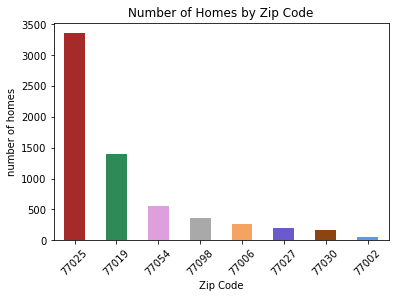

In [25]:
# Plot what how many homes are in each zip code
plt.figure()
houston['zip_code'].value_counts().plot(kind='bar', rot=45, color=["brown", "seagreen", "plum", "darkgrey", "sandybrown", "slateblue","saddlebrown", "cornflowerblue"])
plt.ylabel('number of homes')
plt.xlabel('Zip Code')
plt.title('Number of Homes by Zip Code')
plt.show()

In [26]:
print('The Majority of our homes in this dataset are represented in the zip code of 77025')

The Majority of our homes in this dataset are represented in the zip code of 77025


In [27]:
# Remove the warnings that the Seaborn Plot displays (everything is ok :) )
import warnings
warnings.filterwarnings('ignore')

Text(0.5, 1.0, 'Crime by Zip code')

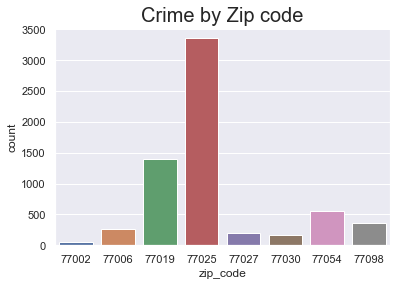

In [28]:
# Plot the amount of crimes commited by zip code
sns.set(style='darkgrid')
sns.countplot(houston[houston['offense_count'] != 0]['zip_code'])
plt.title('Crime by Zip code', size=20)

Zip code 77025 has the most crimes in by far than any other zip code. This is likely contributed to the location of the Astrodome (home of the Houston Astros MLB team), as well as the location of the NRG Stadium (home of the Houston Texans). Though the zip code of 77025 is home to 29,000 people, they are going to experience many passionate sports fans who like to drink and have a good time. 
<br><br>
In 2017 the Houston Astros MLB team had won the World Series increasing their fan population substantially. So in the proceeding years of 2018 and 2019, attendance was up due to the competitiveness of the team within the MLB. With attendance being up the stadium was experiencing fuller stadiums than ever before resulting in higher attendances. The stadium had an average of 35,276 fans and played 24 home games in 2019. This equates to approximately 850,000 people who may be under the influence in the zip code of 77025.<br>
<br> Additionally, the Houston Texans Stadium neighbors the Houston Astros which was home to 9 games in 2019 with an average of 71,793 fans per game (not including tailgating) which equates approximately 650,000 fans. So as a result, between the MLB, and the NFL, the zip code of 77025 experienced 1.5 million sports fans that contribute to the high crime rate in the zip code.


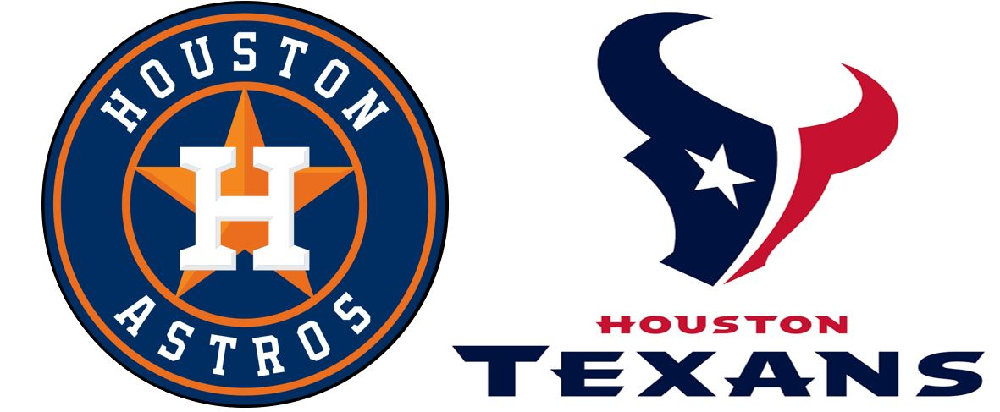

In [29]:
Image(filename = 'MLB_NFL.jpg', width = 600, height = 600)

Lets see what zip codes seem to have the most new owners. This may be due to a new development, or an upcoming area with new money.

**Looking when new owners are buying homes**

In [30]:
y = houston['zip_code'].astype('str')
y

0        77002
3        77002
6        77002
9        77006
12       77006
         ...  
19062    77025
19065    77019
19068    77019
19071    77054
19074    77054
Name: zip_code, Length: 6359, dtype: object

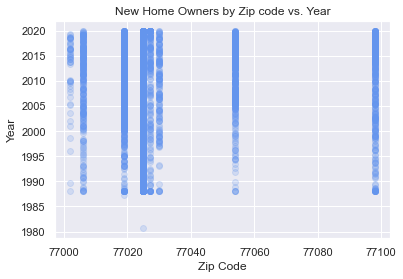

In [31]:
x = houston['new_owner_date']
y = houston['zip_code']

# plot Year vs new home owners by zip
plt.scatter(y,x, color="cornflowerblue", alpha=0.2)
plt.xticks()
plt.title('New Home Owners by Zip code vs. Year')
plt.xlabel('Zip Code')
plt.ylabel('Year')
plt.show()

When we look at our scatter plots, we are looking to see where new owners are beginning to show up. Though the Zip Codes show no apparent "boom" or time where many new owners entered the market. We do see such a relationship exist in zip code 77002. In this zip code we have a large cluster from 2014 -2019 indicating that there likely is a new development in this area resulting in new owners entering the market.

### Checking for Duplicates

In [32]:
# Write a loop to check the columns for duplicated columns
my_dataset = [houston]

for df in my_dataset:
    duplicated_rows = df.duplicated().sum()
    print(f'There are {duplicated_rows} duplicate rows')

There are 0 duplicate rows


In [33]:
# Check for duplicated columns by transposing
# Because duplicated() only works on rows, we need to transpose the dataframe
houston.T

,0,3,6,9,12,15,18,21,24,27,...,19047,19050,19053,19056,19059,19062,19065,19068,19071,19074
id,1,3,4,5,6,7,8,9,10,12,...,19260,19261,19262,19263,19264,19265,19293,19294,19310,19312
appraised_value,299000,296400,299803,330500,356743,335978,363957,356647,373271,262487,...,262508,315724,298583,250000,315290,300000,421361,398706,278000,301273
pct_value_change,0.0,0.0,0.0,-7.162921,4.006706,-12.349373,-12.119522,-12.260939,-6.027497,16.660889,...,-3.938581,-4.946215,-6.692812,0.0,-21.335812,-10.421021,9.999843,4.556409,0.240505,4.955252
new_owner_date,2009-10-13 00:00:00,2018-06-29 00:00:00,2001-01-01 00:00:00,2004-07-23 00:00:00,1998-01-02 00:00:00,2016-09-16 00:00:00,2012-09-18 00:00:00,2016-08-24 00:00:00,2014-06-09 00:00:00,2018-08-16 00:00:00,...,2018-04-26 00:00:00,2018-04-24 00:00:00,2018-04-19 00:00:00,2017-12-19 00:00:00,2018-03-19 00:00:00,2018-01-18 00:00:00,2018-11-12 00:00:00,2019-04-16 00:00:00,2017-12-21 00:00:00,2017-12-01 00:00:00
sq_ft,1944,1944,1944,2308,2592,2292,2630,2560,2544,1120,...,1366,2043,1785,1366,2043,2043,2264,2239,1472,1568
acreage,0.0405,0.0348,0.0395,0.0261,0.0291,0.037,0.0317,0.0291,0.0291,0.1148,...,0.0332,0.0398,0.0415,0.0315,0.0369,0.0369,0.0391,0.0344,0.0364,0.0422
latitude,29.74614,29.74619,29.74624,29.7444,29.7444,29.7444,29.7444,29.7444,29.7444,29.7547,...,29.67817,29.67818,29.67798,29.67797,29.67797,29.67798,29.75595,29.75595,29.68139,29.68139
longitude,-95.36987,-95.36996,-95.37004,-95.38218,-95.38218,-95.38218,-95.38218,-95.38218,-95.38218,-95.37838,...,-95.43608,-95.43601,-95.43601,-95.43608,-95.43615,-95.43622,-95.38843,-95.38843,-95.39861,-95.39861
zip_code,77002,77002,77002,77006,77006,77006,77006,77006,77006,77019,...,77025,77025,77025,77025,77025,77025,77019,77019,77054,77054
offense_count,4743,4743,4743,3669,3669,3669,3669,3669,3669,2310,...,2216,2216,2216,2216,2216,2216,2310,2310,2955,2955


In [34]:
# checking for duplicated columns
houston.T.duplicated().sum()
print(f'There are {houston.T.duplicated().sum()} duplicated columns in our Dataset')

There are 0 duplicated columns in our Dataset


In [35]:
# Lets look at the type of Data we are working with.
houston.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6359 entries, 0 to 19074
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   id                6359 non-null   int64         
 1   appraised_value   6359 non-null   int64         
 2   pct_value_change  6359 non-null   float64       
 3   new_owner_date    6359 non-null   datetime64[ns]
 4   sq_ft             6359 non-null   int64         
 5   acreage           6359 non-null   float64       
 6   latitude          6359 non-null   float64       
 7   longitude         6359 non-null   float64       
 8   zip_code          6359 non-null   int64         
 9   offense_count     6359 non-null   int64         
 10  flood_risk        6359 non-null   int64         
 11  Elementary        6359 non-null   int64         
 12  High              6359 non-null   int64         
 13  Middle            6359 non-null   int64         
dtypes: datetime64[ns](1), f

### One-Hot Encoding


We will be changing our zip code into dummy variables. If we do not make this change, our zip codes will hold numerical value which will not help the performance of our models.


In [36]:
# This is the column we will be one-hot encoding
houston['zip_code'].head()

0     77002
3     77002
6     77002
9     77006
12    77006
Name: zip_code, dtype: int64

In [37]:
one_hot = pd.get_dummies(houston['zip_code'])
one_hot

,77002,77006,77019,77025,77027,77030,77054,77098
0,1,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0
9,0,1,0,0,0,0,0,0
12,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
19062,0,0,0,1,0,0,0,0
19065,0,0,1,0,0,0,0,0
19068,0,0,1,0,0,0,0,0
19071,0,0,0,0,0,0,1,0


In [38]:
# Lets make sure that our zips were chnaged to 0's, and 1's by looking at one of our zip codes
one_hot[77002]

0        1
3        1
6        1
9        0
12       0
        ..
19062    0
19065    0
19068    0
19071    0
19074    0
Name: 77002, Length: 6359, dtype: uint8

In [39]:
# looking at the dataframe before we concatenate it.
houston

,id,appraised_value,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,zip_code,offense_count,flood_risk,Elementary,High,Middle
0,1,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,4743,1,75,95,85
3,3,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,4743,1,75,95,85
6,4,299803,0.000000,2001-01-01,1944,0.0395,29.74624,-95.37004,77002,4743,1,65,95,95
9,5,330500,-7.162921,2004-07-23,2308,0.0261,29.74440,-95.38218,77006,3669,1,65,95,65
12,6,356743,4.006706,1998-01-02,2592,0.0291,29.74440,-95.38218,77006,3669,1,65,95,65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19062,19265,300000,-10.421021,2018-01-18,2043,0.0369,29.67798,-95.43622,77025,2216,1,75,85,85
19065,19293,421361,9.999843,2018-11-12,2264,0.0391,29.75595,-95.38843,77019,2310,1,85,95,85
19068,19294,398706,4.556409,2019-04-16,2239,0.0344,29.75595,-95.38843,77019,2310,1,85,95,85
19071,19310,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,2955,1,55,95,85


In [40]:
# looking at the dataframe before we concatenate it.
one_hot

,77002,77006,77019,77025,77027,77030,77054,77098
0,1,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0
9,0,1,0,0,0,0,0,0
12,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
19062,0,0,0,1,0,0,0,0
19065,0,0,1,0,0,0,0,0
19068,0,0,1,0,0,0,0,0
19071,0,0,0,0,0,0,1,0


In [41]:
# concatenate houston to one_hot to make a combined df
houston_df = pd.concat([houston, one_hot], axis=1)
houston_df

,id,appraised_value,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,zip_code,offense_count,...,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
0,1,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,77002,4743,...,95,85,1,0,0,0,0,0,0,0
3,3,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,77002,4743,...,95,85,1,0,0,0,0,0,0,0
6,4,299803,0.000000,2001-01-01,1944,0.0395,29.74624,-95.37004,77002,4743,...,95,95,1,0,0,0,0,0,0,0
9,5,330500,-7.162921,2004-07-23,2308,0.0261,29.74440,-95.38218,77006,3669,...,95,65,0,1,0,0,0,0,0,0
12,6,356743,4.006706,1998-01-02,2592,0.0291,29.74440,-95.38218,77006,3669,...,95,65,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19062,19265,300000,-10.421021,2018-01-18,2043,0.0369,29.67798,-95.43622,77025,2216,...,85,85,0,0,0,1,0,0,0,0
19065,19293,421361,9.999843,2018-11-12,2264,0.0391,29.75595,-95.38843,77019,2310,...,95,85,0,0,1,0,0,0,0,0
19068,19294,398706,4.556409,2019-04-16,2239,0.0344,29.75595,-95.38843,77019,2310,...,95,85,0,0,1,0,0,0,0,0
19071,19310,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,77054,2955,...,95,85,0,0,0,0,0,0,1,0


In [42]:
# Drop Zip code now that it is one-hot encoded
houston_df.drop(['zip_code'], axis=1, inplace = True)

In [43]:
# Look at our new combined df
houston_df

,id,appraised_value,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,...,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
0,1,299000,0.000000,2009-10-13,1944,0.0405,29.74614,-95.36987,4743,1,...,95,85,1,0,0,0,0,0,0,0
3,3,296400,0.000000,2018-06-29,1944,0.0348,29.74619,-95.36996,4743,1,...,95,85,1,0,0,0,0,0,0,0
6,4,299803,0.000000,2001-01-01,1944,0.0395,29.74624,-95.37004,4743,1,...,95,95,1,0,0,0,0,0,0,0
9,5,330500,-7.162921,2004-07-23,2308,0.0261,29.74440,-95.38218,3669,1,...,95,65,0,1,0,0,0,0,0,0
12,6,356743,4.006706,1998-01-02,2592,0.0291,29.74440,-95.38218,3669,1,...,95,65,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19062,19265,300000,-10.421021,2018-01-18,2043,0.0369,29.67798,-95.43622,2216,1,...,85,85,0,0,0,1,0,0,0,0
19065,19293,421361,9.999843,2018-11-12,2264,0.0391,29.75595,-95.38843,2310,1,...,95,85,0,0,1,0,0,0,0,0
19068,19294,398706,4.556409,2019-04-16,2239,0.0344,29.75595,-95.38843,2310,1,...,95,85,0,0,1,0,0,0,0,0
19071,19310,278000,0.240505,2017-12-21,1472,0.0364,29.68139,-95.39861,2955,1,...,95,85,0,0,0,0,0,0,1,0


---------------

### Outlier Recognition 

In [44]:
# Checking to see if any nulls exist in our dataframe
houston_df.isna().sum()

id                  0
appraised_value     0
pct_value_change    0
new_owner_date      0
sq_ft               0
acreage             0
latitude            0
longitude           0
offense_count       0
flood_risk          0
Elementary          0
High                0
Middle              0
77002               0
77006               0
77019               0
77025               0
77027               0
77030               0
77054               0
77098               0
dtype: int64

In [45]:
# Checking for missing values in our data
houston.isna().sum()

id                  0
appraised_value     0
pct_value_change    0
new_owner_date      0
sq_ft               0
acreage             0
latitude            0
longitude           0
zip_code            0
offense_count       0
flood_risk          0
Elementary          0
High                0
Middle              0
dtype: int64

In [46]:
one_hot.isna().sum()

77002    0
77006    0
77019    0
77025    0
77027    0
77030    0
77054    0
77098    0
dtype: int64

In [47]:
# Lets look at an overview of our data
houston_df.describe()

,id,appraised_value,pct_value_change,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
count,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000,6359.000000
mean,12145.832206,310563.435289,0.943720,1907.370341,0.095822,29.705853,-95.418690,2345.498506,1.595062,78.025633,89.308854,81.112596,0.008335,0.041830,0.219531,0.528070,0.031609,0.026577,0.088379,0.055669
std,5139.434168,79684.076328,8.838883,458.029732,0.077401,0.033537,0.023790,440.723920,0.860357,9.715898,6.244688,7.685049,0.090920,0.200217,0.413962,0.499251,0.174970,0.160855,0.283867,0.229300
min,1.000000,19343.000000,-33.672311,624.000000,0.000000,29.657800,-95.751705,1453.000000,1.000000,55.000000,75.000000,65.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,10412.500000,253552.000000,-3.636178,1579.000000,0.036500,29.678225,-95.438030,2216.000000,1.000000,75.000000,85.000000,75.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,13387.000000,310000.000000,0.000000,1884.000000,0.052100,29.691460,-95.425640,2216.000000,1.000000,75.000000,95.000000,85.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,16114.500000,376626.500000,4.715238,2231.500000,0.172200,29.744890,-95.396145,2310.000000,2.000000,85.000000,95.000000,85.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,19312.000000,450000.000000,156.412785,4817.000000,0.635700,29.800594,-95.352420,4743.000000,3.000000,95.000000,95.000000,95.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


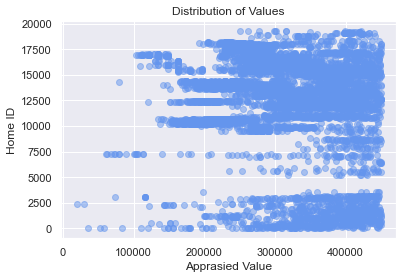

In [48]:
# Looking at the distrbution of our home prices 

plt.figure()
plt.scatter(houston_df['appraised_value'], houston_df['id'], color='cornflowerblue',alpha=0.5)
plt.ylabel('Home ID')
plt.xlabel('Apprasied Value')
plt.title('Distribution of Values')
plt.show()

In [49]:
print('We have a balanced distribution of priced homes, and it seems that the majority of our homes are listed > $ 250,000')

We have a balanced distribution of priced homes, and it seems that the majority of our homes are listed > $ 250,000


Below lets plot our distribbtions as scatter plot to see if any immediate relations exist among the data

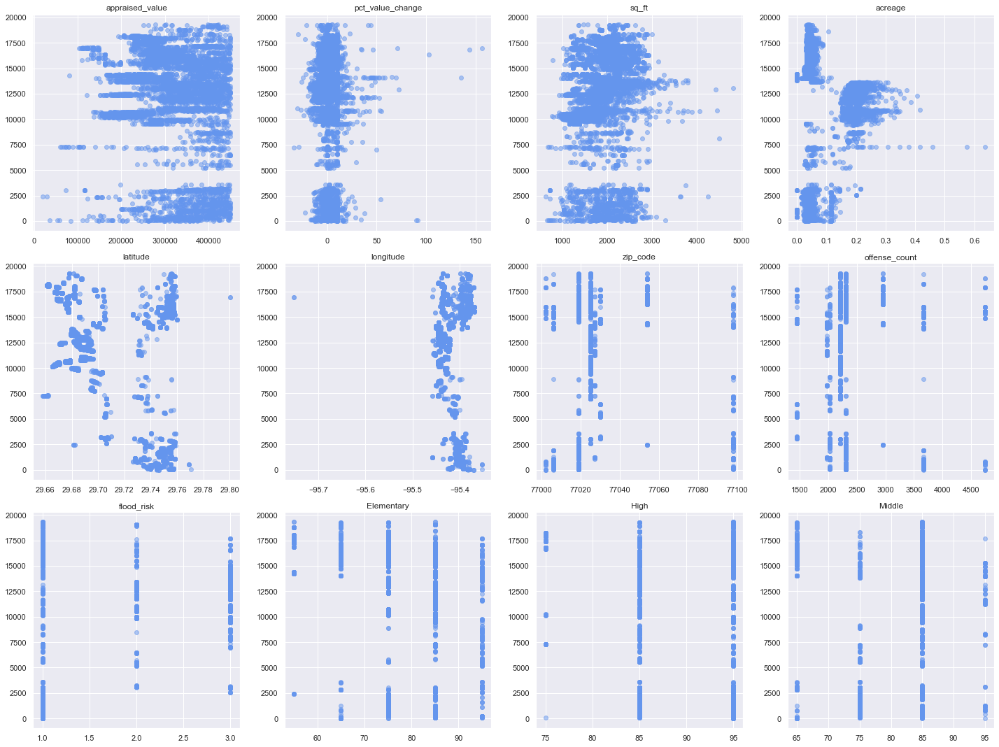

In [50]:
X= houston.drop(['id','new_owner_date'], axis=1)
y= houston['id']

plt.subplots(3, 4, figsize=(20,15)) # 3 rows by 4 columns

count =1

for col in X.columns:
    plt.subplot(3,4,count)
    plt.scatter(X[col],y, color='cornflowerblue', alpha=0.5)
    plt.title(col)
    
    count += 1

plt.tight_layout()
plt.show()


By plotting ID versus our columns, we see a few relationships that exist in our data. In appraised_value, we see that the majority of homes in our data are priced over 250,000 dollars. Also it should be noted that even though our highest value is 450,000 dollars we see a large concentration of data points in this area. This further proves that our dataset is not representative of the population of Houston, and that there are in fact homes that are worth more than $450,000.<br><br>
By looking at our percent value change from 2018 to 2019, we see that we have a spread nominally from negative 20 percent to positive 20 percent resulting in a an interesting spread. No immediately important insights are gathered from the other scatterplots we have plotted.


In [51]:
# Lets look for any potential outliers we may have in our data using the Max command

houston_df.groupby(['appraised_value']).max().tail()

,id,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
appraised_value,,,,,,,,,,,,,,,,,,,,
449900,17142,10.000000,2009-08-31,2701,0.0549,29.68139,-95.42686,2216,1,85,95,85,0,0,0,1,0,0,0,0
449971,5501,1.344820,2017-05-19,2240,0.0500,29.70543,-95.41587,1453,2,95,95,85,0,0,0,0,0,1,0,0
449978,1369,2.280745,2016-01-26,2648,0.0316,29.74708,-95.40609,2310,1,75,95,75,0,0,1,0,0,0,0,0
449985,13229,3.444828,1997-07-31,2551,0.2784,29.68053,-95.43330,2216,2,85,85,85,0,0,0,1,0,0,0,0
450000,18020,37.614679,2019-02-02,2829,0.2328,29.75825,-95.38350,4743,3,95,95,95,1,1,1,1,1,1,0,0


Our most expensive house in our Houston Dataframe is found to be $450,000

In [52]:
# Lets look for any potential outliers we may have in our data using the Max command

houston_df.groupby(['appraised_value']).max().head()

,id,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
appraised_value,,,,,,,,,,,,,,,,,,,,
19343,2416,0.000000,2006-06-16,624,0.1217,29.68139,-95.39840,2955,1,55,95,85,0,0,0,0,0,0,1,0
30100,2418,0.000000,1996-02-26,1117,0.1148,29.68140,-95.39825,2955,1,55,95,85,0,0,0,0,0,0,1,0
35918,30,9.999081,1997-03-22,1668,0.0367,29.75550,-95.38322,2310,1,65,95,65,0,0,1,0,0,0,0,0
53214,67,-7.121165,1988-01-02,756,0.0234,29.75707,-95.38324,2310,1,65,95,65,0,0,1,0,0,0,0,0
57554,68,-2.285229,2013-09-10,654,0.0252,29.75713,-95.38336,2310,1,65,95,65,0,0,1,0,0,0,0,0


Our lowest house price in our Data is found to be $19,343 

In [53]:
# Finding our biggest gain in home value

houston_df.groupby(['pct_value_change']).max().tail()

,id,appraised_value,new_owner_date,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
pct_value_change,,,,,,,,,,,,,,,,,,,,
91.354967,39,283523,2018-08-28,1330,0.0574,29.75686,-95.37933,2310,1,65,95,65,0,0,1,0,0,0,0,0
102.475602,16331,300000,2018-11-30,1625,0.0659,29.75466,-95.38292,2310,1,65,95,65,0,0,1,0,0,0,0,0
135.506880,14072,233100,2009-06-22,1700,0.0295,29.70021,-95.42228,2216,3,85,95,85,0,0,0,1,0,0,0,0
143.677965,16846,300009,2018-08-31,1497,0.0595,29.75533,-95.37987,2310,1,65,95,65,0,0,1,0,0,0,0,0
156.412785,16984,260000,2018-10-31,1416,0.0394,29.75685,-95.38163,2310,1,65,95,65,0,0,1,0,0,0,0,0


Our biggest gain from last years home value appraisal is 156.41%

In [54]:
# Finding our biggest loss in home value

houston_df.groupby(['pct_value_change']).max().head()

,id,appraised_value,new_owner_date,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
pct_value_change,,,,,,,,,,,,,,,,,,,,
-33.672311,7233,294548,2016-08-01,1544,0.0369,29.74488,-95.41228,2310,1,95,85,75,0,0,1,0,0,0,0,0
-30.472152,11024,303836,1995-04-09,2846,0.1828,29.69103,-95.42880,2216,3,85,95,85,0,0,0,1,0,0,0,0
-29.565108,18341,285000,2019-01-10,2369,0.0377,29.67396,-95.44480,2216,1,75,85,85,0,0,0,1,0,0,0,0
-29.093641,7244,259535,2011-08-31,2020,0.0374,29.74489,-95.41246,2310,1,95,85,75,0,0,1,0,0,0,0,0
-26.832890,10939,241420,2019-08-07,2138,0.2040,29.69196,-95.42796,2216,3,85,95,85,0,0,0,1,0,0,0,0


Our biggest loss from last years home value appraisal is 33.67%

In [55]:
# Finding our largest square footage home

houston_df.groupby(['sq_ft']).max().tail()

,id,appraised_value,pct_value_change,new_owner_date,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
sq_ft,,,,,,,,,,,,,,,,,,,,
4252,2378,427500,0.000000,2018-04-26,0.1148,29.75906,-95.40098,2310,1,85,95,85,0,0,1,0,0,0,0,0
4415,12920,444241,72.150403,2012-10-24,0.3333,29.69233,-95.43146,2216,3,85,95,85,0,0,0,1,0,0,0,0
4447,10857,442622,9.999901,1997-03-28,0.2874,29.68742,-95.43704,2216,3,85,85,85,0,0,0,1,0,0,0,0
4493,8102,443427,7.237485,2018-01-26,0.1929,29.69443,-95.43173,2216,3,85,95,85,0,0,0,1,0,0,0,0
4817,13041,345815,9.999746,2007-04-27,0.2884,29.69064,-95.43405,2216,3,85,85,85,0,0,0,1,0,0,0,0


Our largest home is 4,817 square feet

In [56]:
# Finding our smallest square footage home

houston_df.groupby(['sq_ft']).max().head()

,id,appraised_value,pct_value_change,new_owner_date,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
sq_ft,,,,,,,,,,,,,,,,,,,,
624,2416,19343,0.000000,2006-06-16,0.1217,29.68139,-95.39840,2955,1,55,95,85,0,0,0,0,0,0,1,0
654,68,57554,-2.285229,2013-09-10,0.0252,29.75713,-95.38336,2310,1,65,95,65,0,0,1,0,0,0,0,0
672,7289,60557,0.000000,2009-07-31,0.1731,29.66176,-95.44446,2216,1,85,75,85,0,0,0,1,0,0,0,0
684,63,202753,9.999946,2004-04-15,0.1148,29.75681,-95.38355,2310,1,65,95,65,0,0,1,0,0,0,0,0
713,7279,260600,15.391939,2018-08-28,0.1148,29.75687,-95.38367,2310,1,85,95,85,0,0,1,1,0,0,0,0


Our smallest home is 624 square feet

In [57]:
# Finding our largest lot size of home (acreage)

houston_df.groupby(['acreage']).max().tail()

,id,appraised_value,pct_value_change,new_owner_date,sq_ft,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
acreage,,,,,,,,,,,,,,,,,,,,
0.4154,7290,181445,0.000000,1995-09-29,1633,29.66174,-95.44552,2216,1,85,75,85,0,0,0,1,0,0,0,0
0.4158,10923,369994,-16.537938,2018-08-17,2868,29.69463,-95.42687,2216,3,85,95,85,0,0,0,1,0,0,0,0
0.4591,7272,140000,0.000000,2012-07-13,1302,29.65808,-95.44594,2216,1,85,75,85,0,0,0,1,0,0,0,0
0.5739,7273,166000,0.000000,2014-05-21,754,29.65828,-95.44594,2216,1,85,75,85,0,0,0,1,0,0,0,0
0.6357,7276,210000,0.000000,2010-01-02,1608,29.65874,-95.44520,2216,1,85,75,85,0,0,0,1,0,0,0,0


Our largest lot size is 0.6357 acers

In [58]:
# Finding our largest lot size of home (acreage)

houston_df.groupby(['acreage']).max().head()

,id,appraised_value,pct_value_change,new_owner_date,sq_ft,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
acreage,,,,,,,,,,,,,,,,,,,,
0.0000,14453,449851,65.476977,2019-12-06,3272,29.74917,-95.39202,3669,3,95,95,95,0,1,1,1,1,0,1,1
0.0146,2308,171004,0.000000,1992-01-31,1152,29.73933,-95.40629,2027,1,75,85,75,0,0,0,0,0,0,0,1
0.0149,2307,146800,0.000000,2006-05-05,1152,29.73933,-95.40629,2027,1,75,85,75,0,0,0,0,0,0,0,1
0.0150,1743,269170,10.000000,2009-10-30,1465,29.74603,-95.40652,2310,1,75,85,75,0,0,1,0,0,0,0,0
0.0151,1741,299730,11.817022,2013-08-19,1441,29.74603,-95.40652,2310,1,75,85,75,0,0,1,0,0,0,0,0


Our smallest value is 0.0000 acers, but this was likely not counted properly. 
Our smallest value recorded is found to be 0.0146 acers

In [59]:
# Finding home that has the most offenses commited in one year

houston_df.groupby(['offense_count']).max().tail()

,id,appraised_value,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
offense_count,,,,,,,,,,,,,,,,,,,,
2216,19265,450000,135.506880,2019-12-30,4817,0.6357,29.706500,-95.42019,3,95,95,85,0,0,0,1,0,0,0,0
2310,19294,450000,156.412785,2019-12-23,4252,0.1958,29.800594,-95.37531,3,95,95,85,0,0,1,0,0,0,0,0
2955,19312,380998,24.581174,2019-12-30,3634,0.1217,29.698280,-95.37698,1,85,95,85,0,0,0,0,0,0,1,0
3669,19214,450000,37.614679,2019-12-16,2962,0.1456,29.752690,-95.37946,1,85,95,95,0,1,0,0,0,0,0,0
4743,18804,450000,16.754232,2019-05-14,3096,0.1286,29.770440,-95.35242,1,85,95,95,1,0,0,0,0,0,0,0


The home that has the most crime in it's neighbourhood is found to be 4743 commited crimes

In [60]:
# Finding home that has the most offenses commited in one year

houston_df.groupby(['offense_count']).max().head()

,id,appraised_value,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
offense_count,,,,,,,,,,,,,,,,,,,,
1453,17688,450000,11.081114,2019-12-13,2888,0.2152,29.710030,-95.39066,3,95,95,95,0,0,0,0,0,1,0,0
1979,17693,450000,65.476977,2019-12-18,3399,0.3302,29.751900,-95.43189,1,95,85,95,0,0,0,0,1,0,0,0
2027,17870,449814,34.338000,2019-12-31,2940,0.1578,29.741070,-95.40251,1,95,95,75,0,0,0,0,0,0,0,1
2216,19265,450000,135.506880,2019-12-30,4817,0.6357,29.706500,-95.42019,3,95,95,85,0,0,0,1,0,0,0,0
2310,19294,450000,156.412785,2019-12-23,4252,0.1958,29.800594,-95.37531,3,95,95,85,0,0,1,0,0,0,0,0


The home that has the least crime in it's neighbourhood is found to be 1453 commited crimes

In [61]:
# Finding home that has the most offenses commited in one year

houston_df.groupby(['flood_risk']).max().tail()

,id,appraised_value,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,offense_count,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
flood_risk,,,,,,,,,,,,,,,,,,,,
1,19312,450000,156.412785,2019-12-31,4252,0.6357,29.800594,-95.352420,4743,95,95,95,1,1,1,1,1,0,1,1
2,19071,450000,17.495122,2019-12-16,3525,0.3717,29.759691,-95.376472,2310,95,95,85,0,0,1,1,0,1,0,0
3,17688,450000,135.506880,2019-12-30,4817,0.4158,29.760160,-95.388310,2310,95,95,95,0,0,1,1,0,1,0,0


The homes that are in the most danger of a flood have a maximum risk of 3.0

In [62]:
# Finding home that has the most offenses commited in one year

houston_df.groupby(['flood_risk']).max().head()

,id,appraised_value,pct_value_change,new_owner_date,sq_ft,acreage,latitude,longitude,offense_count,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
flood_risk,,,,,,,,,,,,,,,,,,,,
1,19312,450000,156.412785,2019-12-31,4252,0.6357,29.800594,-95.352420,4743,95,95,95,1,1,1,1,1,0,1,1
2,19071,450000,17.495122,2019-12-16,3525,0.3717,29.759691,-95.376472,2310,95,95,85,0,0,1,1,0,1,0,0
3,17688,450000,135.506880,2019-12-30,4817,0.4158,29.760160,-95.388310,2310,95,95,95,0,0,1,1,0,1,0,0


The homes that are in the least danger of a flood have a minimum risk of 1.0

# Geo Mapping

In [63]:
# creating a dataframe to map on
map_data = houston.drop(columns=['pct_value_change','new_owner_date','offense_count','Elementary','High','Middle'])

In [64]:
map_data

,id,appraised_value,sq_ft,acreage,latitude,longitude,zip_code,flood_risk
0,1,299000,1944,0.0405,29.74614,-95.36987,77002,1
3,3,296400,1944,0.0348,29.74619,-95.36996,77002,1
6,4,299803,1944,0.0395,29.74624,-95.37004,77002,1
9,5,330500,2308,0.0261,29.74440,-95.38218,77006,1
12,6,356743,2592,0.0291,29.74440,-95.38218,77006,1
...,...,...,...,...,...,...,...,...
19062,19265,300000,2043,0.0369,29.67798,-95.43622,77025,1
19065,19293,421361,2264,0.0391,29.75595,-95.38843,77019,1
19068,19294,398706,2239,0.0344,29.75595,-95.38843,77019,1
19071,19310,278000,1472,0.0364,29.68139,-95.39861,77054,1


In [65]:
# exporting the dataframe to a csv.

# running this makes a new file BTW
map_data.to_csv('C:/Users/randy/Desktop/mapped_data.csv')

In [66]:
import pandas as pd
houston_homes = pd.read_csv("mapped_data.csv")

import plotly.express as px

fig = px.scatter_mapbox(houston_homes[houston_homes['zip_code']==77002],
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="appraised_value",
                        hover_data=["zip_code", "sq_ft", "acreage","flood_risk"],
                        color_discrete_sequence=["red"], 
                        opacity=0.6,
                        size_max=5,
                        zoom=9, height=500)

fig2 = px.scatter_mapbox(houston_homes[houston_homes['zip_code']==77006],
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="appraised_value",
                        hover_data=["zip_code", "sq_ft", "acreage","flood_risk"],
                        color_discrete_sequence=["purple"], 
                        opacity=0.6,
                        size_max=5,
                        zoom=9, height=500)
fig.add_trace(fig2.data[0])
fig3 = px.scatter_mapbox(houston_homes[houston_homes['zip_code']==77019],
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="appraised_value",
                        hover_data=["zip_code", "sq_ft", "acreage","flood_risk"],
                        color_discrete_sequence=["teal"], 
                        opacity=0.6,
                        size_max=5,
                        zoom=9, height=500)
fig.add_trace(fig3.data[0])
fig4 = px.scatter_mapbox(houston_homes[houston_homes['zip_code']==77025],
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="appraised_value",
                        hover_data=["zip_code", "sq_ft", "acreage","flood_risk"],
                        color_discrete_sequence=["cornflowerblue"], 
                        opacity=0.6,
                        size_max=5,
                        zoom=9, height=500)
fig.add_trace(fig4.data[0])
fig4 = px.scatter_mapbox(houston_homes[houston_homes['zip_code']==77027],
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="appraised_value",
                        hover_data=["zip_code", "sq_ft", "acreage","flood_risk"],
                        color_discrete_sequence=["orange"], 
                        opacity=0.6,
                        size_max=5,
                        zoom=9, height=500)
fig.add_trace(fig4.data[0])
fig4 = px.scatter_mapbox(houston_homes[houston_homes['zip_code']==77030],
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="appraised_value",
                        hover_data=["zip_code", "sq_ft", "acreage","flood_risk"],
                        color_discrete_sequence=["magenta"], 
                        opacity=0.6,
                        size_max=5,
                        zoom=9, height=500)
fig.add_trace(fig4.data[0])
fig4 = px.scatter_mapbox(houston_homes[houston_homes['zip_code']==77054],
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="appraised_value",
                        hover_data=["zip_code", "sq_ft", "acreage","flood_risk"],
                        color_discrete_sequence=["yellow"], 
                        opacity=0.6,
                        size_max=5,
                        zoom=9, height=500)
fig.add_trace(fig4.data[0])
fig4 = px.scatter_mapbox(houston_homes[houston_homes['zip_code']==77098],
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="appraised_value",
                        hover_data=["zip_code", "sq_ft", "acreage", "flood_risk"],
                        color_discrete_sequence=["green"], 
                        opacity=0.6,
                        size_max=5,
                        zoom=9, height=500)
fig.add_trace(fig4.data[0])

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

| Zip Code   | Color   |
|-------------|-------|
| blue | 77025 |
| pink | 77030 |
| yellow | 77054|
| orange | 77027|
| green | 77098 |
| red | 77002 |
| purple | 77006|
| teal | 77019 |


Each color is represented by a zip code, and by hovering over a point, you will see the Apprasied Value, followed by some stats about the property such as: Latitude, Longitude, Zip Code, Square Feet, Acreage, and the Flood Risk. (Homes with a Flood Risk of 1 are of lower risk, vs. homes with a 3)<br><br>
The 6,359 homes are all represented on this map, and therefore evaluated in all proceeding Machine Learning Models. You can interact with each of the points giving you an overview of the data.

----------

---------------------------

# Colinearity

Which columns are strongly or moderately cordinated with the apprasial value? Which columns are not

* 0.7 to 1 as a "strong correlation"
* 0.5 -0.7 as a "moderate correlation"
* 0.0 - 0.5 as a "weak correlation"

For the sake of this linear regression model, we will be dropping `id`, and `pct_value_change` because when we run this with these features, we get an R Squared value of 97%. We suspect that our model is lerning from pct_value_change giving us an exceptional score.<br>
When we remove our zip codes from one_hot we get 97% test accuracy. When we apply them, we get 57%.

In [67]:
# We will not be using 'id' or 'new_owner_date' with the ML models so we can drop it.

houston_df.drop(columns=['id','new_owner_date'], inplace=True)

In [68]:
pd.set_option('display.max_columns', None)
houston_df

,appraised_value,pct_value_change,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
0,299000,0.000000,1944,0.0405,29.74614,-95.36987,4743,1,75,95,85,1,0,0,0,0,0,0,0
3,296400,0.000000,1944,0.0348,29.74619,-95.36996,4743,1,75,95,85,1,0,0,0,0,0,0,0
6,299803,0.000000,1944,0.0395,29.74624,-95.37004,4743,1,65,95,95,1,0,0,0,0,0,0,0
9,330500,-7.162921,2308,0.0261,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
12,356743,4.006706,2592,0.0291,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19062,300000,-10.421021,2043,0.0369,29.67798,-95.43622,2216,1,75,85,85,0,0,0,1,0,0,0,0
19065,421361,9.999843,2264,0.0391,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19068,398706,4.556409,2239,0.0344,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19071,278000,0.240505,1472,0.0364,29.68139,-95.39861,2955,1,55,95,85,0,0,0,0,0,0,1,0


In [69]:
# Find the numeric columns
numeric_df = houston_df.select_dtypes(['int64','float64','uint8'])
correlation = list()

# iterate over columns and find their correlation with appraisal_value
for col in numeric_df:
    # Append to the list
    correlation.append(stats.pearsonr(numeric_df[col], houston_df['appraised_value']))



In [70]:
# lets look at the correlation and p-values

correlation

[(1.0, 0.0),
 (0.01961187945356569, 0.11787401823760213),
 (0.5408068641382874, 0.0),
 (0.04216039737443471, 0.0007714365039491392),
 (0.30861477146875305, 2.222926520929061e-140),
 (0.10589467297098684, 2.5277191921682346e-17),
 (-0.022050085585750515, 0.07871084749452695),
 (0.18887543809955484, 3.7842852041777845e-52),
 (0.431611549610694, 6.240120991237503e-287),
 (0.21781976372192918, 3.6496112094144084e-69),
 (0.01807001027355319, 0.14964195912795625),
 (0.03994981970789432, 0.0014406639837816395),
 (0.13479593221706973, 3.584738704421227e-27),
 (0.07569706005265847, 1.5050550019852238e-09),
 (-0.17602144623408364, 2.0238620105792902e-45),
 (0.1506887830442373, 1.2970573618130492e-33),
 (0.11047590546707069, 1.0006217490740757e-18),
 (-0.16965231220713048, 2.8496909226348662e-42),
 (0.13059136718103936, 1.3674362499082636e-25)]

In [71]:
# create a dataframe

pearson_appraised_value = pd.DataFrame(correlation, index=numeric_df.columns, columns = ['correlation', 'p-value'])
pearson_appraised_value

,correlation,p-value
appraised_value,1.000000,0.000000e+00
pct_value_change,0.019612,1.178740e-01
sq_ft,0.540807,0.000000e+00
acreage,0.042160,7.714365e-04
latitude,0.308615,2.222927e-140
longitude,0.105895,2.527719e-17
offense_count,-0.022050,7.871085e-02
flood_risk,0.188875,3.784285e-52
Elementary,0.431612,6.240121e-287
High,0.217820,3.649611e-69


<AxesSubplot:>

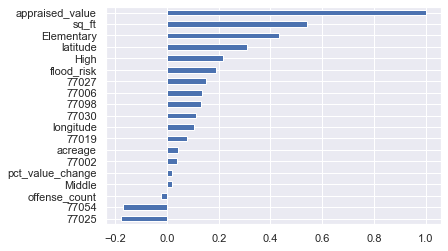

In [72]:
# lets plot the results and see what features are the most correlated.

plt.plot()
pearson_appraised_value['correlation'].sort_values().plot(kind='barh')

In [73]:
houston_df

,appraised_value,pct_value_change,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
0,299000,0.000000,1944,0.0405,29.74614,-95.36987,4743,1,75,95,85,1,0,0,0,0,0,0,0
3,296400,0.000000,1944,0.0348,29.74619,-95.36996,4743,1,75,95,85,1,0,0,0,0,0,0,0
6,299803,0.000000,1944,0.0395,29.74624,-95.37004,4743,1,65,95,95,1,0,0,0,0,0,0,0
9,330500,-7.162921,2308,0.0261,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
12,356743,4.006706,2592,0.0291,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19062,300000,-10.421021,2043,0.0369,29.67798,-95.43622,2216,1,75,85,85,0,0,0,1,0,0,0,0
19065,421361,9.999843,2264,0.0391,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19068,398706,4.556409,2239,0.0344,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19071,278000,0.240505,1472,0.0364,29.68139,-95.39861,2955,1,55,95,85,0,0,0,0,0,0,1,0


# Linear Regression

Instantiate Fit and optimize a linear regression

Dependent variable = target =  𝑦 <br>
Independent variables = features =  𝑋

In [74]:
# split the data into independednt and dependent variables

# independent variables
X = houston_df.drop(['appraised_value'], axis=1) 

# Dependent variables
y = houston_df['appraised_value']

In [75]:
# View our X, and y variables
display(X)
print(y)

,pct_value_change,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
0,0.000000,1944,0.0405,29.74614,-95.36987,4743,1,75,95,85,1,0,0,0,0,0,0,0
3,0.000000,1944,0.0348,29.74619,-95.36996,4743,1,75,95,85,1,0,0,0,0,0,0,0
6,0.000000,1944,0.0395,29.74624,-95.37004,4743,1,65,95,95,1,0,0,0,0,0,0,0
9,-7.162921,2308,0.0261,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
12,4.006706,2592,0.0291,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19062,-10.421021,2043,0.0369,29.67798,-95.43622,2216,1,75,85,85,0,0,0,1,0,0,0,0
19065,9.999843,2264,0.0391,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19068,4.556409,2239,0.0344,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19071,0.240505,1472,0.0364,29.68139,-95.39861,2955,1,55,95,85,0,0,0,0,0,0,1,0


0        299000
3        296400
6        299803
9        330500
12       356743
          ...  
19062    300000
19065    421361
19068    398706
19071    278000
19074    301273
Name: appraised_value, Length: 6359, dtype: int64


**Model Assumptions**

* no multicollinearity among the indepenedent variables (done before model fitting)
* the indepenedent variables are in some way linearly correlated with the dependent variable (done before model fiting)
* the residuals are normally distributed (done after model fitting)
* the residuals are homoscedastic (done after model fitting)

Before fitting the linear regression model, we can assess the assumptions of multicollinearity and linearity 

In [76]:
# Looking at our DataFrame
houston_df

,appraised_value,pct_value_change,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
0,299000,0.000000,1944,0.0405,29.74614,-95.36987,4743,1,75,95,85,1,0,0,0,0,0,0,0
3,296400,0.000000,1944,0.0348,29.74619,-95.36996,4743,1,75,95,85,1,0,0,0,0,0,0,0
6,299803,0.000000,1944,0.0395,29.74624,-95.37004,4743,1,65,95,95,1,0,0,0,0,0,0,0
9,330500,-7.162921,2308,0.0261,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
12,356743,4.006706,2592,0.0291,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19062,300000,-10.421021,2043,0.0369,29.67798,-95.43622,2216,1,75,85,85,0,0,0,1,0,0,0,0
19065,421361,9.999843,2264,0.0391,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19068,398706,4.556409,2239,0.0344,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19071,278000,0.240505,1472,0.0364,29.68139,-95.39861,2955,1,55,95,85,0,0,0,0,0,0,1,0


# Removing multicollinearity


In [77]:
# Removing multicollinearity
pd.Series(data = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])], index = X.columns)

pct_value_change     1.073941
sq_ft                1.100217
acreage              1.946124
latitude            41.499789
longitude            6.846573
offense_count             inf
flood_risk           3.531089
Elementary           2.850340
High                 2.816759
Middle               4.317152
77002                     inf
77006                     inf
77019                     inf
77025                     inf
77027                     inf
77030                     inf
77054                     inf
77098                     inf
dtype: float64

When you one hot encode or create dummy variables and do not drop one of the dummies, you will have perfect multicollinearity. Perfect multicollinearity will result in a VIF of inf. By perfect multicollinearity, some other combination of columns can perfectly predict the other columns. Since crime rate is reported per zip code, it is also perfectly predicted by the other columns.

----------

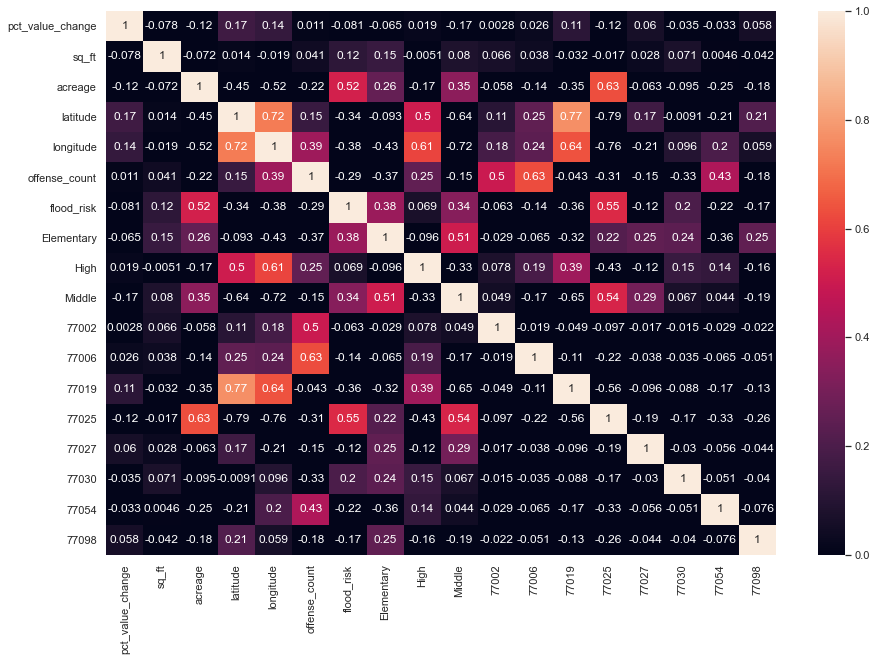

In [78]:
# Plot a correlation heat map showing what has the most correlation with X
plt.figure(figsize=(15, 10))
sns.heatmap(data=(X.corr()), annot=True, vmin=0, vmax=1)
plt.show()

Independent Variables linearily correlated with dependant variables

In [79]:
# Lets see the coefficients to see our level of correlation. 
X.corrwith(y)

pct_value_change    0.019612
sq_ft               0.540807
acreage             0.042160
latitude            0.308615
longitude           0.105895
offense_count      -0.022050
flood_risk          0.188875
Elementary          0.431612
High                0.217820
Middle              0.018070
77002               0.039950
77006               0.134796
77019               0.075697
77025              -0.176021
77027               0.150689
77030               0.110476
77054              -0.169652
77098               0.130591
dtype: float64

Based on the coefficients we see the following relationship:<br> 
Square Feet (0.5408) “Moderate Correlation”, Elementary School Rating (0.4316) “Weak Correlation”, and Latitude (0.3086) “Weak Correlation”

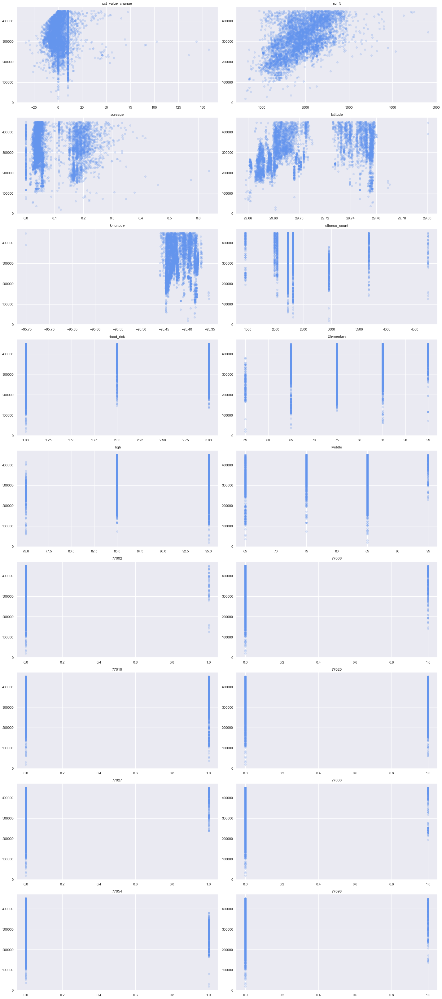

In [80]:
# loop over the columns and plot the relationship between each column and the target

plt.subplots(9,2, figsize=(20,45))

count =1

for col in X.columns:
    plt.subplot(9,2,count)
    plt.scatter(X[col],y, color="cornflowerblue", alpha=0.2)
    plt.title(col)
    
    count+= 1

plt.tight_layout()
plt.show()

## Model Fitting

In [81]:
# add constant to independent variables matrix
X_c = sm.add_constant

In [82]:
# Instantiate and Fit
linreg = sm.OLS(y, X).fit()

# Results
linreg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        appraised_value   R-squared:                       0.583
Model:                            OLS   Adj. R-squared:                  0.582
Method:                 Least Squares   F-statistic:                     553.5
Date:                Sun, 11 Apr 2021   Prob (F-statistic):               0.00
Time:                        11:47:23   Log-Likelihood:                -78010.
No. Observations:                6359   AIC:                         1.561e+05
Df Residuals:                    6342   BIC:                         1.562e+05
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
pct_value_change   297.8960     75.781      3.931      0.000     149.340     446.452
sq_ft               85.1374      1.480     57.519      0.000      82.236      88.039
acreage            2.08e+05   1.16e+04     17.857      0.000    1.85e+05    2.31e+05
latitude          1.283e+06   1.24e+05     10.333      0.000    1.04e+06    1.53e+06
longitude         6.039e+05   7.11e+04      8.495      0.000    4.65e+05    7.43e+05
offense_count     6346.3119   2739.383      2.317      0.021     976.195    1.17e+04
flood_risk        3814.2507   1411.701      2.702      0.007    1046.840    6581.662
Elementary        3012.2068    112.314     26.820      0.000    2792.034    3232.380
High                71.0605    173.713      0.409      0.683    -269.475     411.596
Middle             516.7559    174.751      2.957      0.003     174.185     859.327
77002             -1.08e+07   4.64e+06     -2.325      0.020   -1.99e+07    -1.7e+06
77006             -3.93e+06    1.7e+06     -2.311      0.021   -7.27e+06   -5.96e+05
77019             4.661e+06   2.02e+06      2.305      0.021    6.96e+05    8.63e+06
77025               5.3e+06   2.28e+06      2.328      0.020    8.38e+05    9.76e+06
77027             6.791e+06   2.93e+06      2.318      0.021    1.05e+06    1.25e+07
77030             1.012e+07   4.37e+06      2.319      0.020    1.56e+06    1.87e+07
77054             6.242e+05   2.51e+05      2.487      0.013    1.32e+05    1.12e+06
77098             6.484e+06    2.8e+06      2.318      0.020       1e+06     1.2e+07
==============================================================================
Omnibus:                      419.307   Durbin-Watson:                   0.918
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              780.565
Skew:                          -0.480   Prob(JB):                    3.18e-170
Kurtosis:                       4.423   Cond. No.                     4.49e+19
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.96e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

By using Order of Least Squares, our Linear Regression has a variance explained of 0.583

## Results and Interpretation

In [83]:
linreg.params.sort_values()

77002              -1.080072e+07
77006              -3.930434e+06
High                7.106051e+01
sq_ft               8.513741e+01
pct_value_change    2.978960e+02
Middle              5.167559e+02
Elementary          3.012207e+03
flood_risk          3.814251e+03
offense_count       6.346312e+03
acreage             2.080252e+05
longitude           6.039095e+05
77054               6.242106e+05
latitude            1.282919e+06
77019               4.661130e+06
77025               5.299831e+06
77098               6.484138e+06
77027               6.791493e+06
77030               1.012298e+07
dtype: float64

### Linear Regression Parameters

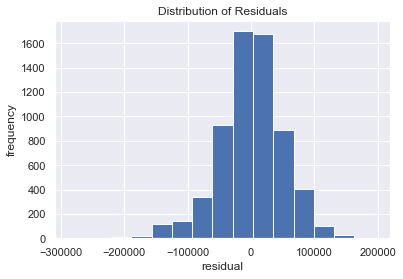

In [84]:
# plot distribution of the residuals
plt.figure()
plt.hist(linreg.resid, bins=15)
plt.title('Distribution of Residuals')
plt.xlabel('residual')
plt.ylabel('frequency')
plt.show()

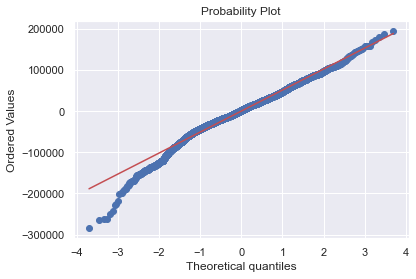

In [85]:
# Q-Q Plot
stats.probplot(linreg.resid, dist='norm', plot=plt);

When we plot our Q-Q visualization, we are looking to find the distribution of the residuals to fall on our line. Perfectly normal distributed data would have plots on the entire line. When we observe our relationship, we see that the data follows the line for the most part, but skews on one of the tails. Since the skew is relatively minor and only on one of the tails, we can make the assumption that our data is normally distributed, but lets verify this by using a Shapiro-Wilk Test.

In [86]:
# Shapiro Wilk Test

stats.shapiro(linreg.resid)

ShapiroResult(statistic=0.9815362691879272, pvalue=5.476859427491313e-28)

**Null Hypothesis: The distribution of our Houston Data is not normally distributed.**<br><br>
When we use a Shapiro-Wilk Test we are looking at our outputted P-Value. A P-Value less than 0.05 allows us to reject our null hypothesis. When we conduct a Shapiro-Wilk Test on our data, we get a result of 3.17 x 10^24 which allows us to reject our null hypothesis. Therefore, concluding that the distribution of our Houston Data is in fact, normally distributed.


When we are looking for covariance, we are looking for any patters that develop in our data as seen in the image bellow. If a pattern exists we will have a problem with our models performance. Lets check for homoscedasticity and make sure no patterns exist in our data.


<img src="https://drive.google.com/uc?export=view&id=1I-MaRxbYMgwYNrPtR9CXWqBTtYFhWcH7" width=600>
<center>(Image Source: <a>https://upload.wikimedia.org/wikipedia/commons/d/d4/Correlation_examples2.svg</a>)</center>

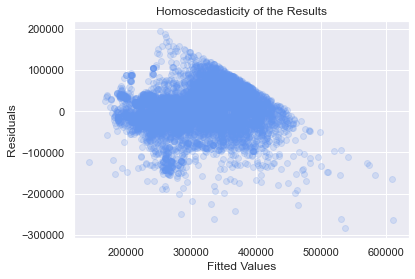

In [87]:
# Check for Homoscedasticity
plt.figure()
plt.scatter(linreg.fittedvalues, linreg.resid, color="cornflowerblue", alpha=0.2)
plt.title('Homoscedasticity of the Results')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

When we are looking for covariance, (which we don’t want) we are looking for any patterns in our scatterplot, as seen in the image above. So, when we plot our scatter plot, we have an ideal “buckshot” distribution indicating little covariance, however the upper right seems to have an irregular border. This is because our dataset has a maximum appraised value of 450,000 USD which is not truly the maximum in Houston. <br><br>
Our “buckshot” that we anticipated has an irregular border in our scatterplot, and that is due to our house price being capped. Had the appraised value been represented by the population of Houston TX, we would have not seen the cropped section in our scatterplot, and we would have had the entire representation of our homoscedasticity. However, this is a Proof of Concept and will be further evaluated in Phase 2 of our analysis completed later this year. But for now, we will assume that the highest priced home in Houston TX based on our sample is 450,000 USD, and that we have homoscedastic data.


# Scaling With Linear Regression

In [88]:
pd.set_option('display.max_columns', None)

houston_df

,appraised_value,pct_value_change,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
0,299000,0.000000,1944,0.0405,29.74614,-95.36987,4743,1,75,95,85,1,0,0,0,0,0,0,0
3,296400,0.000000,1944,0.0348,29.74619,-95.36996,4743,1,75,95,85,1,0,0,0,0,0,0,0
6,299803,0.000000,1944,0.0395,29.74624,-95.37004,4743,1,65,95,95,1,0,0,0,0,0,0,0
9,330500,-7.162921,2308,0.0261,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
12,356743,4.006706,2592,0.0291,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19062,300000,-10.421021,2043,0.0369,29.67798,-95.43622,2216,1,75,85,85,0,0,0,1,0,0,0,0
19065,421361,9.999843,2264,0.0391,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19068,398706,4.556409,2239,0.0344,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19071,278000,0.240505,1472,0.0364,29.68139,-95.39861,2955,1,55,95,85,0,0,0,0,0,0,1,0


In [89]:
houston_df

,appraised_value,pct_value_change,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
0,299000,0.000000,1944,0.0405,29.74614,-95.36987,4743,1,75,95,85,1,0,0,0,0,0,0,0
3,296400,0.000000,1944,0.0348,29.74619,-95.36996,4743,1,75,95,85,1,0,0,0,0,0,0,0
6,299803,0.000000,1944,0.0395,29.74624,-95.37004,4743,1,65,95,95,1,0,0,0,0,0,0,0
9,330500,-7.162921,2308,0.0261,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
12,356743,4.006706,2592,0.0291,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19062,300000,-10.421021,2043,0.0369,29.67798,-95.43622,2216,1,75,85,85,0,0,0,1,0,0,0,0
19065,421361,9.999843,2264,0.0391,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19068,398706,4.556409,2239,0.0344,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19071,278000,0.240505,1472,0.0364,29.68139,-95.39861,2955,1,55,95,85,0,0,0,0,0,0,1,0


In [90]:
# independent variables
X = houston_df.drop(['appraised_value'], axis=1) 

# Dependent variables
y = houston_df['appraised_value']

In [91]:
display(X)
print(y)

,pct_value_change,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
0,0.000000,1944,0.0405,29.74614,-95.36987,4743,1,75,95,85,1,0,0,0,0,0,0,0
3,0.000000,1944,0.0348,29.74619,-95.36996,4743,1,75,95,85,1,0,0,0,0,0,0,0
6,0.000000,1944,0.0395,29.74624,-95.37004,4743,1,65,95,95,1,0,0,0,0,0,0,0
9,-7.162921,2308,0.0261,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
12,4.006706,2592,0.0291,29.74440,-95.38218,3669,1,65,95,65,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19062,-10.421021,2043,0.0369,29.67798,-95.43622,2216,1,75,85,85,0,0,0,1,0,0,0,0
19065,9.999843,2264,0.0391,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19068,4.556409,2239,0.0344,29.75595,-95.38843,2310,1,85,95,85,0,0,1,0,0,0,0,0
19071,0.240505,1472,0.0364,29.68139,-95.39861,2955,1,55,95,85,0,0,0,0,0,0,1,0


0        299000
3        296400
6        299803
9        330500
12       356743
          ...  
19062    300000
19065    421361
19068    398706
19071    278000
19074    301273
Name: appraised_value, Length: 6359, dtype: int64


In [92]:
from sklearn.model_selection import train_test_split

In [93]:
# split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=10)

In [94]:
X_train

,pct_value_change,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
15888,-0.196414,2040,0.0367,29.66951,-95.42018,2955,1,75,95,85,0,0,0,0,0,0,1,0
7995,0.000000,1225,0.1653,29.67237,-95.44356,2216,1,75,85,85,0,0,0,1,0,0,0,0
8235,1.739016,2983,0.1791,29.68425,-95.43233,2216,3,85,85,85,0,0,0,1,0,0,0,0
14508,0.000000,1896,0.0322,29.75672,-95.39617,2310,1,85,95,85,0,0,1,0,0,0,0,0
7377,6.805324,1602,0.1920,29.68614,-95.43595,2216,3,85,85,85,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3540,0.000000,1376,0.0317,29.70328,-95.42883,2216,3,85,95,85,0,0,0,1,0,0,0,0
10323,0.000000,2084,0.0615,29.67993,-95.44461,2216,3,75,85,85,0,0,0,1,0,0,0,0
4032,8.036526,1006,0.1503,29.68051,-95.42753,2216,2,85,95,85,0,0,0,1,0,0,0,0
13869,1.552565,2534,0.0344,29.74934,-95.38161,3669,1,65,95,65,0,1,0,0,0,0,0,0


In [95]:
# This is the full size of our data
X.shape

(6359, 18)

In [96]:
y.shape

(6359,)

In [97]:
# this will be 80% of our X data 
len(X_train)

5087

In [98]:
# The test data will make up for 20% of our test data
len(X_test)

1272

In [99]:
# Instantiate

from sklearn.linear_model import LinearRegression
linreg = LinearRegression()

In [100]:
# fit the model
linreg.fit(X_train,y_train)

LinearRegression()

In [101]:
linreg.predict(X_test)

array([337620.95483207, 370070.7956528 , 329933.62355835, ...,
       381914.98009279, 378003.17943211, 284744.83177648])

In [102]:
y_test

1815     423500
2334     329908
17628    293945
291      299983
17004    252994
          ...  
16500    268632
11430    187545
16623    328000
16422    447424
3456     281950
Name: appraised_value, Length: 1272, dtype: int64

In [103]:
linreg.score(X_test,y_test)

0.5857003348198551

In [104]:
print(f'Our Model has an R Squared score of:{linreg.score(X_test,y_test)}, so our model predicts 58.6% of the variance in our data.')

Our Model has an R Squared score of:0.5857003348198551, so our model predicts 58.6% of the variance in our data.


# Model Scores

**Model Assessment - Test Accuracy, Train Accuracy** <br>
 
| Model   | R Squared (Variance Explained)   |
|-------------|-------|
| Linear Regression (non-scaled) | 0.5857 |
| Linear Regression (scaled) | - |
| PCA | -|
| PCA (n=14) | -|
| Decision Tree | - |
| Random Forest | - |}


**Repeat this for houston_df but using Standard Scaler**
<br>
Now lets apply a standard scaler and see how it will affect our Linear Regression.

In [105]:
# independent variables
X = houston_df.drop(['appraised_value'], axis=1) 

# Dependent variables
y = houston_df['appraised_value']

In [106]:
# Split our data into train and test, and use a test split of 20%

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=10)

In [107]:
# Plot out our features and versus the variance, and compare it against features vs variance **After the Standard Scaler** 

def plots(houston_df, var, t):
    plt.figure(figsize=(13,5))
    plt.subplot(121)
    sns.kdeplot(houston_df[var])
    plt.title('Before ' +str(t).split('(')[0])
    
    plt.subplot(122)
    p1 = t.fit_transform(houston_df[[var]]).flatten()
    sns.kdeplot(p1)
    plt.title('After ' +str(t).split('(')[0])

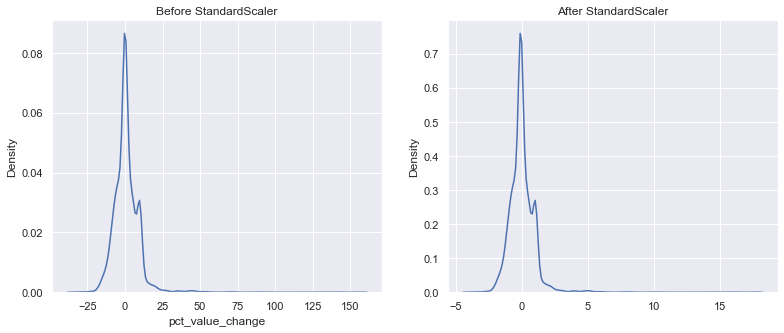

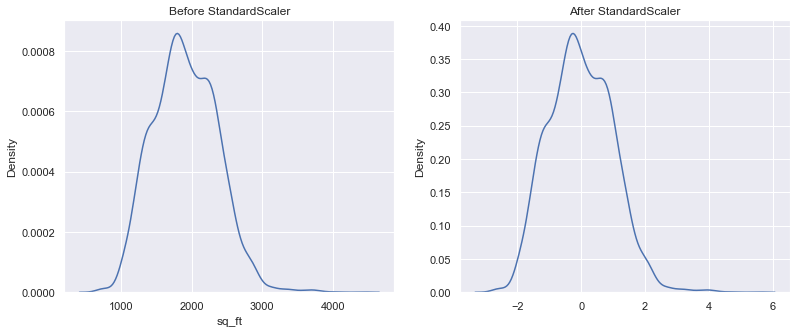

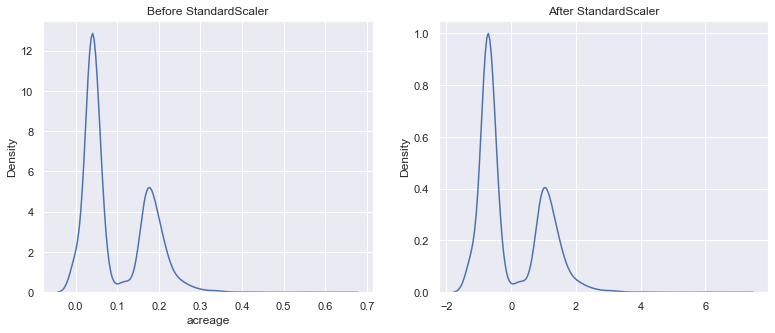

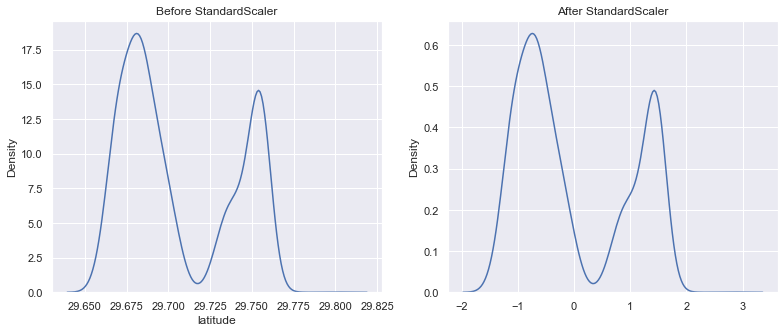

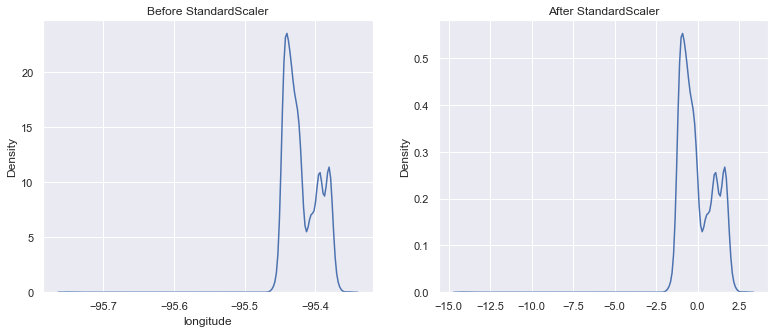

...

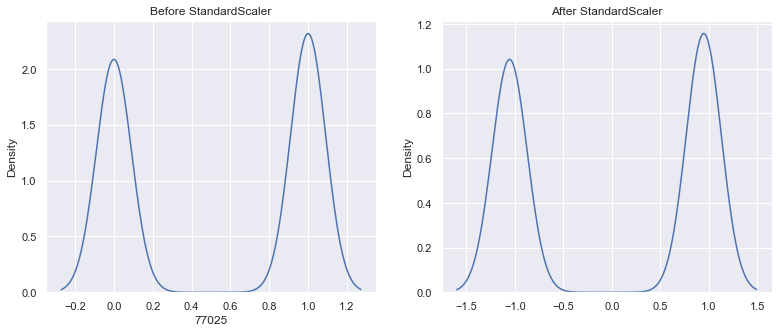

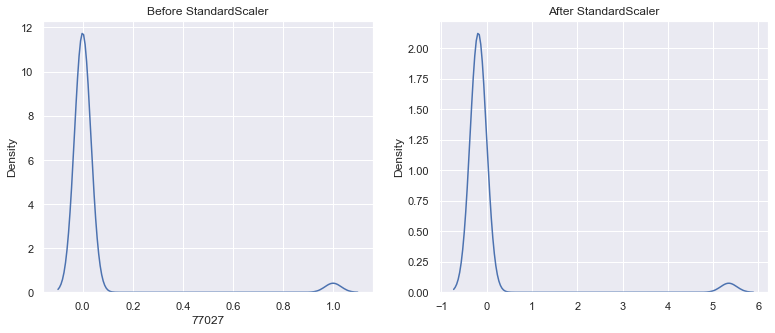

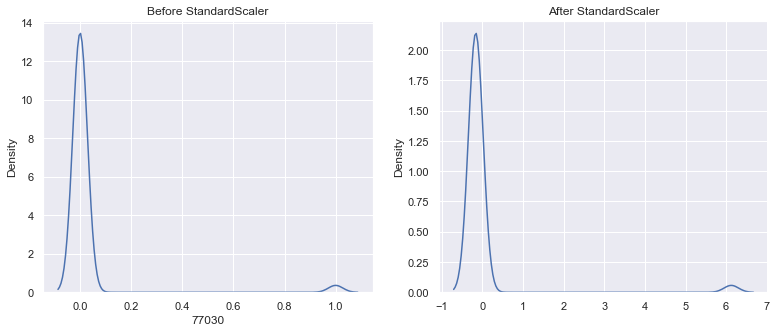

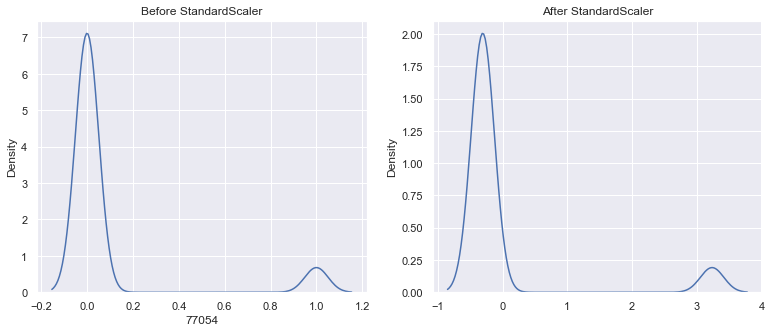

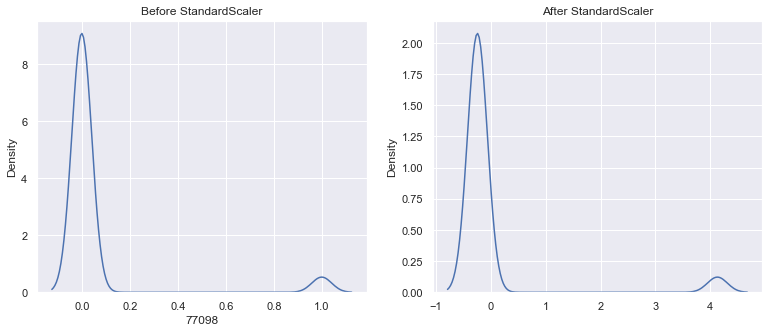

In [108]:
for col in X_train.columns:
    plots(X_train, col, StandardScaler())

When we compare the before, and after scaling using the Standard Scaler, we do not see much of an affect on our plots, therefore we should not see a large change in our R Squared score when we score our model.

### Standard Scaler

In [109]:
#Instantiate the model
scaler = StandardScaler()

#fit the model
scaler.fit(X_train)
#model
X_scaled_train = scaler.transform(X_train)
X_scaled_test = scaler.transform(X_test)
fit_model = linreg.fit(X_scaled_train, y_train)

In [110]:
y_train

15888    286584
7995     183000
8235     423743
14508    317800
7377     332454
          ...  
3540     289871
10323    259623
4032     266202
13869    438244
3867     287662
Name: appraised_value, Length: 5087, dtype: int64

In [111]:
X_train

,pct_value_change,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
15888,-0.196414,2040,0.0367,29.66951,-95.42018,2955,1,75,95,85,0,0,0,0,0,0,1,0
7995,0.000000,1225,0.1653,29.67237,-95.44356,2216,1,75,85,85,0,0,0,1,0,0,0,0
8235,1.739016,2983,0.1791,29.68425,-95.43233,2216,3,85,85,85,0,0,0,1,0,0,0,0
14508,0.000000,1896,0.0322,29.75672,-95.39617,2310,1,85,95,85,0,0,1,0,0,0,0,0
7377,6.805324,1602,0.1920,29.68614,-95.43595,2216,3,85,85,85,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3540,0.000000,1376,0.0317,29.70328,-95.42883,2216,3,85,95,85,0,0,0,1,0,0,0,0
10323,0.000000,2084,0.0615,29.67993,-95.44461,2216,3,75,85,85,0,0,0,1,0,0,0,0
4032,8.036526,1006,0.1503,29.68051,-95.42753,2216,2,85,95,85,0,0,0,1,0,0,0,0
13869,1.552565,2534,0.0344,29.74934,-95.38161,3669,1,65,95,65,0,1,0,0,0,0,0,0


In [112]:
# Fit our data to our train set
scaled_score = fit_model.score(X_scaled_test,y_test)
scaled_score

0.5857003348198738

In [113]:
print(f'We get an R Squared Value of {scaled_score}. There was no model performance by scaling our data.')

We get an R Squared Value of 0.5857003348198738. There was no model performance by scaling our data.


We did not see much of a difference from scaling our Data. Lets try using PCA to reduce the dimensionality and see if we can improve our R^2


# Model Scores

**Model Assessment - Test Accuracy, Train Accuracy** <br>
 
| Model   | R Squared (Variance Explained)   |
|-------------|-------|
| Linear Regression (non-scaled) | 0.5857 |
| Linear Regression (scaled) | 0.5812 |
| PCA | -|
| PCA (n=14) | -|
| Decision Tree | - |
| Random Forest | - |}


-----------------

# PCA

In [114]:
from sklearn.decomposition import PCA

In [115]:
# Instantiate 
my_PCA = PCA()

In [116]:
# Fit PCA to Train
my_PCA.fit(X_scaled_train)

PCA()

In [117]:
X_PCA = my_PCA.transform(X_scaled_test)

In [118]:
# assign PCA explained variance ratio results to df to plot results (ex_variance = explained variance)
ex_variance = my_PCA.explained_variance_ratio_
print(ex_variance)

[2.82621875e-01 1.19288929e-01 9.09496102e-02 8.88914619e-02
 7.27397689e-02 6.40314655e-02 5.76818616e-02 5.44817636e-02
 5.05220956e-02 4.33833061e-02 2.52352889e-02 2.08782497e-02
 1.47652817e-02 8.15211835e-03 5.61109949e-03 7.65824745e-04
 7.15848152e-33 1.79188427e-33]


In [119]:
# Instantiate

linreg = LinearRegression()

In [120]:
linreg.fit(X_PCA,y_test)

LinearRegression()

In [121]:
linreg.score(X_PCA,y_test)

0.5946126447714168

# Model Scores

**Model Assessment - Test Accuracy, Train Accuracy** <br>
 
| Model   | R Squared (Variance Explained)   |
|-------------|-------|
| Linear Regression (non-scaled) | 0.5857 |
| Linear Regression (scaled) | 0.5812 |
| PCA | 0.5946|
| PCA (n=14) | -|
| Decision Tree | - |
| Random Forest | - |}


Lets reduce the PC's and see if we can improve our model's performance

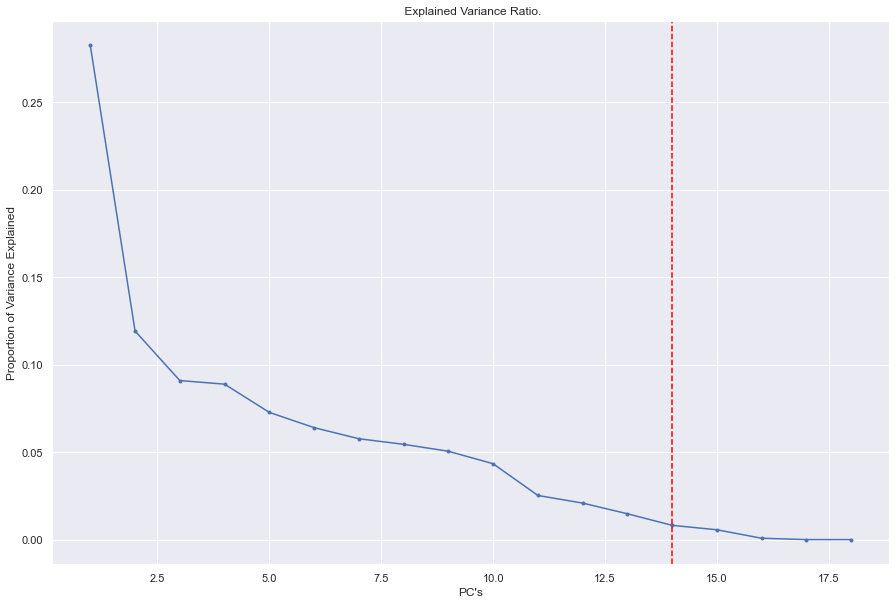

In [122]:
# plot the results
plt.figure(figsize=(15,10))
plt.plot(range(1,len(ex_variance)+1), ex_variance, marker='.')
plt.title(" Explained Variance Ratio.")
plt.xlabel("PC's")
plt.ylabel("Proportion of Variance Explained")
plt.axvline(14, color='red', linestyle='--')
plt.xticks()
plt.show()

In [123]:
# Get the cumulative sum of the variance explained
ex_var_cumulative = my_PCA.explained_variance_ratio_.cumsum()
print(ex_var_cumulative)

[0.28262187 0.4019108  0.49286041 0.58175188 0.65449164 0.71852311
 0.77620497 0.83068674 0.88120883 0.92459214 0.94982743 0.97070568
 0.98547096 0.99362308 0.99923418 1.         1.         1.        ]


When we plot our Principal Component Analysis, we are looking for the point where we exhibit an elbow, or a point of inflection where the slope changes the most into the horizontal direction. At the point where the slope changes the most, is the point where the proportion of the variance explained decreases. Points past this inflection, are less reflective of the variance in our model, and can be less helpful with our models performance. <br><br>
When we look at our PC graph, we see that the point where we have the most inflection is when we have 11 PC’s. So lets use a PCA value of 11 for our model.<br><br>
PCA removes the bias in our model


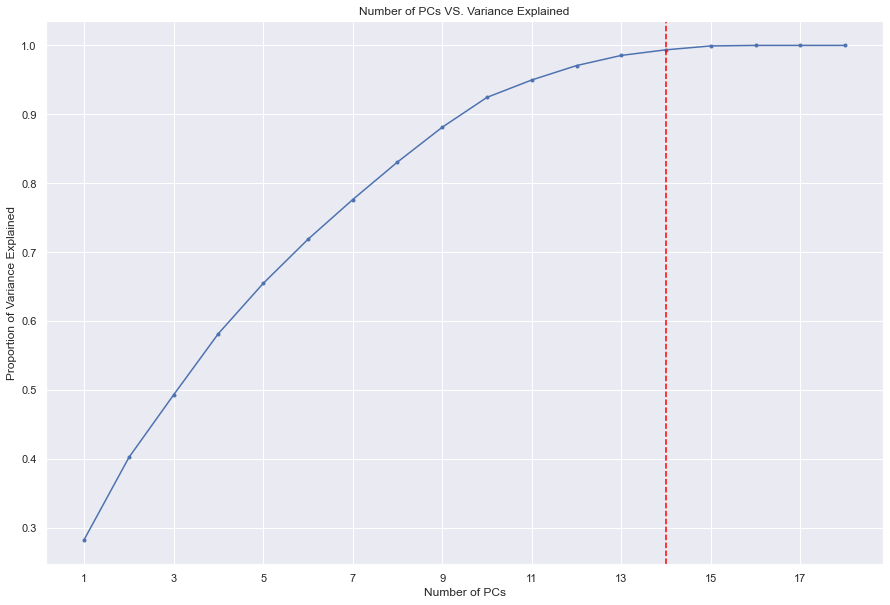

In [124]:
plt.figure(figsize=(15,10))
plt.plot(range(1,19),ex_var_cumulative,marker='.')
plt.title('Number of PCs VS. Variance Explained')
plt.xlabel('Number of PCs')
plt.ylabel('Proportion of Variance Explained')
plt.xticks(range(1,19,2))
plt.axvline(14, color='red', linestyle='--')
plt.show()

* 50% of the variation is explained in the first 4 PC's 
* 95% of the variation is explained in the first 11 PC's

Now lets reduce the number of principal components to see if our model will perform better.

In [125]:
# Instantiate 
my_pca = PCA(n_components=14)

In [126]:
# Fit PCA to Train
my_pca.fit(X_scaled_train)

PCA(n_components=14)

In [127]:
X_pca = my_pca.transform(X_scaled_test)

In [128]:
# assign PCA explained variance ratio results to df to plot results (ex_variance = explained variance)
ex_variance02 = my_pca.explained_variance_ratio_
print(ex_variance02)

[0.28262187 0.11928893 0.09094961 0.08889146 0.07273977 0.06403147
 0.05768186 0.05448176 0.0505221  0.04338331 0.02523529 0.02087825
 0.01476528 0.00815212]


In [129]:
# Instantiate

linreg = LinearRegression()

In [130]:
linreg.fit(X_pca,y_test)

LinearRegression()

In [131]:
linreg.score(X_pca,y_test)

0.587962869907166

In [132]:
print(f'When we use 14 components, we get an R Squared of {linreg.score(X_pca,y_test)}. This slightly underperforms than before, where we did not reduce our PCs')

When we use 14 components, we get an R Squared of 0.587962869907166. This slightly underperforms than before, where we did not reduce our PCs


# Model Scores

**Model Assessment - Test Accuracy, Train Accuracy** <br>
 
| Model   | R Squared (Variance Explained)   |
|-------------|-------|
| Linear Regression (non-scaled) | 0.5857 |
| Linear Regression (scaled) | 0.5812 |
| PCA | 0.5946|
| PCA (n=14) | 0.5880|
| Decision Tree | - |
| Random Forest | - |}


--------------

# Decision Trees

In [133]:
X_train

,pct_value_change,sq_ft,acreage,latitude,longitude,offense_count,flood_risk,Elementary,High,Middle,77002,77006,77019,77025,77027,77030,77054,77098
15888,-0.196414,2040,0.0367,29.66951,-95.42018,2955,1,75,95,85,0,0,0,0,0,0,1,0
7995,0.000000,1225,0.1653,29.67237,-95.44356,2216,1,75,85,85,0,0,0,1,0,0,0,0
8235,1.739016,2983,0.1791,29.68425,-95.43233,2216,3,85,85,85,0,0,0,1,0,0,0,0
14508,0.000000,1896,0.0322,29.75672,-95.39617,2310,1,85,95,85,0,0,1,0,0,0,0,0
7377,6.805324,1602,0.1920,29.68614,-95.43595,2216,3,85,85,85,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3540,0.000000,1376,0.0317,29.70328,-95.42883,2216,3,85,95,85,0,0,0,1,0,0,0,0
10323,0.000000,2084,0.0615,29.67993,-95.44461,2216,3,75,85,85,0,0,0,1,0,0,0,0
4032,8.036526,1006,0.1503,29.68051,-95.42753,2216,2,85,95,85,0,0,0,1,0,0,0,0
13869,1.552565,2534,0.0344,29.74934,-95.38161,3669,1,65,95,65,0,1,0,0,0,0,0,0


In [134]:
# finding the max depth that we should go to
np.sqrt(X_train.shape[0]).round().astype('int')

71

In [135]:
# Searching for max depth in intervals from 1-78
md_vals = range(1,71,1)
list(md_vals)

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70]

In [136]:
%%time
# create an empty list for our R Squared scores from the Decision Tree
R_Squared_Scores = []

for md in md_vals:
    #instantiate 
    my_dt = DecisionTreeRegressor(max_depth=md, random_state=1)
                
    #fit
    RS1 = my_dt.fit(X_train, y_train)
    
    #append and score
    score1 = my_dt.score(X_train, y_train)
    R_Squared_Scores.append(score1)

Wall time: 2.1 s


In [137]:
R_Squared_Scores

[0.23584453464414,
 0.4427269919332024,
 0.5724999197072747,
 0.6437151432473229,
 0.7075793430411608,
 0.7710705482469891,
 0.8199084933431503,
 0.8522069488972435,
 0.879615352857145,
 0.9049081856920888,
 0.9273173800984086,
 0.9440891787459045,
 0.9588175747690997,
 0.9706710123655387,
 0.9781676845867738,
 0.9849984593242502,
 0.9897879221176963,
 0.9926924119002352,
 0.9948623309311067,
 0.9965900708449688,
 0.9976514041252125,
 0.9985012614927826,
 0.99892470943889,
 0.9991707435857959,
 0.9992900319589256,
 0.9993735606743128,
 0.9995173584667428,
 0.9995537060305221,
 0.9995637819280705,
 0.9995799016663656,
 0.9995836771623691,
 0.9995862983533872,
 0.9995863962313809,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.9995864229008742,
 0.999586422900874

In [138]:
%%time
# create an empty list for our R Squared scores from the Decision Tree
R_Squared_Scores02 = []

for md in md_vals:
    #instantiate 
    my_dt = DecisionTreeRegressor(max_depth=md, random_state=1)
                
    #fit
    RS2 = my_dt.fit(X_train, y_train)
    
    #append and score
    score02 = my_dt.score(X_test, y_test)
    R_Squared_Scores02.append(score02)

Wall time: 2.05 s


In [139]:
R_Squared_Scores02

[0.2291736609954551,
 0.43392489090798303,
 0.566063446530729,
 0.6371519254527727,
 0.6977048152838963,
 0.735524097452938,
 0.7684392008134135,
 0.7684460818580496,
 0.772722311310924,
 0.7747640932040869,
 0.7796986335829962,
 0.7554272242291968,
 0.7482138075660141,
 0.7408910038815568,
 0.7425704600797128,
 0.7270950576965112,
 0.7325114524486702,
 0.7270441648633965,
 0.7138992038210755,
 0.7223623073006149,
 0.7131134773890095,
 0.726936928585219,
 0.7174668438054466,
 0.7318714811852114,
 0.7216141148241441,
 0.7188104867394922,
 0.7147450706766344,
 0.7191491042260539,
 0.70904649141537,
 0.7170227334104705,
 0.7107701561617158,
 0.7096889876518222,
 0.7155511591447252,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.7082198900738772,
 0.708219890073877

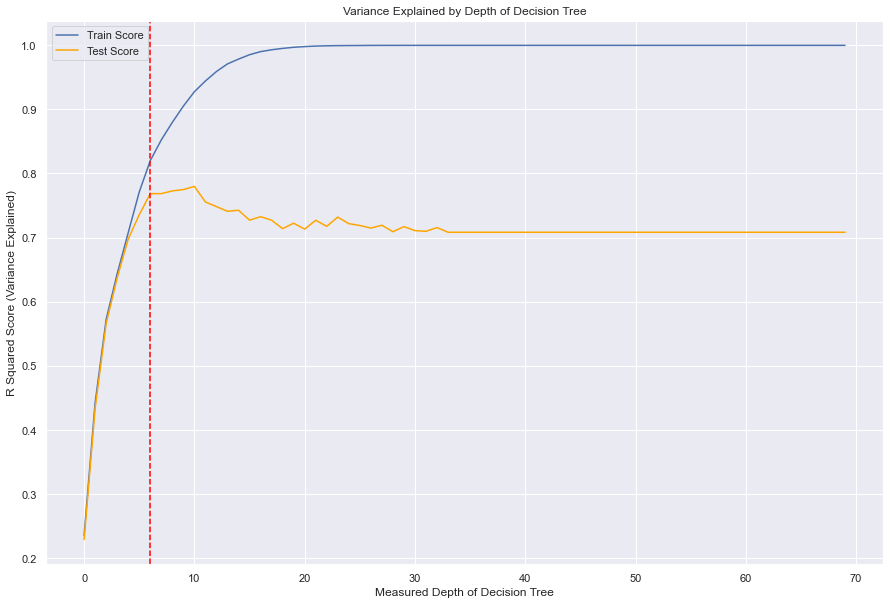

In [140]:
# Visualizing the results

plt.figure(figsize=(15,10))
plt.plot(R_Squared_Scores, label ='Train Score')
plt.plot(R_Squared_Scores02, c='orange', label ='Test Score')
plt.title('Variance Explained by Depth of Decision Tree')
plt.xlabel('Measured Depth of Decision Tree')
plt.axvline(6, color='red', linestyle='--')
plt.ylabel('R Squared Score (Variance Explained)')
plt.legend()
plt.show()

In [141]:
print('The optimal depth of our decision tree should be a 6 as this provides the best R Squared Score before it begins to overfit to our data')
print(f'At a depth of 6 our R Squared score is {R_Squared_Scores02[6]}.')

The optimal depth of our decision tree should be a 6 as this provides the best R Squared Score before it begins to overfit to our data
At a depth of 6 our R Squared score is 0.7684392008134135.


In [142]:
from sklearn import tree
DT_model = tree.DecisionTreeRegressor(max_depth=6).fit(X_train,y_train)

In [143]:
# Plot the Decision Tree

plt.figure(figsize=(300,150))
tree.plot_tree(DT_model, filled=True, fontsize=130)

[Text(8370.0, 7571.571428571428, 'X[3] <= 29.681\nmse = 6263752691.172\nsamples = 5087\nvalue = 311301.37'),
 Text(4185.0, 6406.714285714286, 'X[1] <= 1818.0\nmse = 2915618623.856\nsamples = 1482\nvalue = 251355.573'),
 Text(2092.5, 5241.857142857143, 'X[4] <= -95.439\nmse = 1266302365.749\nsamples = 730\nvalue = 215649.13'),
 Text(1046.25, 4077.0, 'X[3] <= 29.664\nmse = 1002352293.312\nsamples = 521\nvalue = 203009.388'),
 Text(523.125, 2912.142857142857, 'X[2] <= 0.361\nmse = 2370405217.467\nsamples = 13\nvalue = 118161.385'),
 Text(261.5625, 1747.2857142857138, 'X[1] <= 1676.5\nmse = 1110631642.889\nsamples = 9\nvalue = 93183.667'),
 Text(130.78125, 582.4285714285716, 'mse = 263396280.122\nsamples = 7\nvalue = 80254.857'),
 Text(392.34375, 582.4285714285716, 'mse = 1443278090.25\nsamples = 2\nvalue = 138434.5'),
 Text(784.6875, 1747.2857142857138, 'X[1] <= 1455.0\nmse = 642726504.688\nsamples = 4\nvalue = 174361.25'),
 Text(653.90625, 582.4285714285716, 'mse = 169000000.0\nsamples =

# Model Scores

**Model Assessment - Test Accuracy, Train Accuracy** <br>
 
| Model   | R Squared (Variance Explained)   |
|-------------|-------|
| Linear Regression (non-scaled) | 0.5857 |
| Linear Regression (scaled) | 0.5812 |
| PCA | 0.5946|
| PCA (n=14) | 0.5880|
| Decision Tree | 0.7684 |
| Random Forest | - |}


-------------

# Random Forest

In [144]:
from sklearn.ensemble import RandomForestRegressor

In [145]:
n_estimators = np.arange(100)+1

train_scores = list()
test_scores = list()

for n_est in n_estimators:
    
    # instantiate
    my_rf = RandomForestRegressor(n_estimators=n_est, n_jobs=-1)
    
    #fit
    my_rf.fit(X_train, y_train)
    
    #score
    train_scores.append(my_rf.score(X_train, y_train))
    test_scores.append(my_rf.score(X_test, y_test))
    
    print(n_est, end=' ')

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 

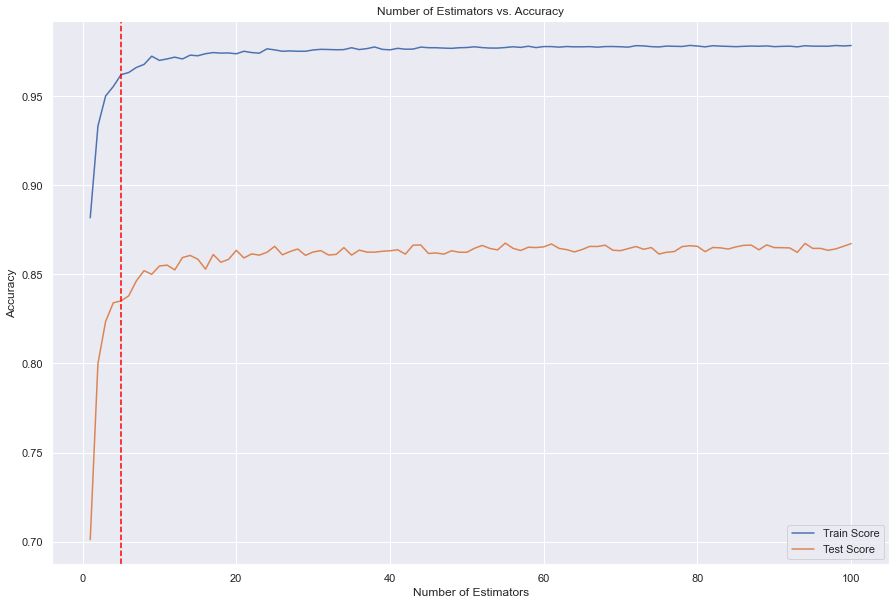

In [146]:
# Plot
plt.figure(figsize=(15,10))
plt.plot(n_estimators, train_scores, label='Train Score')
plt.plot(n_estimators, test_scores, label='Test Score')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.axvline(5, color='red', linestyle='--')
plt.title('Number of Estimators vs. Accuracy')
plt.legend()
plt.show()

In [147]:
print(f'When our Random Forest is at 5 trees, we see our best model performance of {test_scores[5]}.')

When our Random Forest is at 5 trees, we see our best model performance of 0.8379324680930671.


# Model Scores

**Model Assessment - Test Accuracy, Train Accuracy** <br>
 
| Model   | R Squared (Variance Explained)   |
|-------------|-------|
| Linear Regression (non-scaled) | 0.5857 |
| Linear Regression (scaled) | 0.5812 |
| PCA | 0.5946|
| PCA (n=14) | 0.5880|
| Decision Tree | 0.7684 |
| Random Forest | 0.8422 |}


-------------

# Conclusion

To wrap things up, we have identified several Machine Learning models and determined what seemed to have performed better than others. And what we determined is that the Random Forest Regressor proved to be the best when our forest consisted of 5 trees. Now that we have produced a model with a reputable R Squared value of 0.8422, the next step is repeating this process with new data with the same features. <br><br>
I would like to introduce Phase 2 of this project where we will be using a web scraper to find 2021 real estate data, and see if our model can predict the price of real estate 2 years later. Furthermore, Phase 2 will be a more accurate representation of our founded results because I will be including a wider variety of data covering more zip codes in the city, and finding listings that exceed $450,000. Additionally, with a more concise evaluation, I can explore other Machine Learning Algorithms that we had not covered during the duration of this Capstone and see if we can outperform a Random Forest Regressor. <br><br>
Findings will be public this summer on my personal GitHub https://github.com/miskuski . Should you have any questions or concerns, I am best reached by E-Mail RandyMiskuski@gmail.com
